## Homework #5. Exploratory Data Analysis
#### Author: `Cristina Cherevko`
#### Total time spent on h/w (in minutes): `3879`

Below you will see analysis of data from telegram. I mostly concentrated on parsing messages and analysing their content. There are a couple of graphs that show analysis of same data, but answers different questions.

In [1]:
import pandas as pd

In [2]:
from config import DIALOGS_MERGED_DATA_PATH, DIALOGS_META_MERGED_DATA_PATH, my_id, gender, mood_emojis, ua_stopwords, ru_stopwords

In [3]:
df = pd.read_csv(DIALOGS_MERGED_DATA_PATH)
df_meta = pd.read_csv(DIALOGS_META_MERGED_DATA_PATH)

Merged dataset

In [4]:
merged_dataframe = df.merge(df_meta, left_on = ['dialog_id'], right_on = ['dialog_id'], how = 'left')

Necessary functions

In [5]:
import ast
import re
import numpy
import matplotlib.pyplot as plt
import plotly.express as px
from datetime import datetime
import plotly.offline as pyo


import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "browser"

# Set notebook mode to work in offline
pyo.init_notebook_mode()

def find_name_u(x):
    f_name = ast.literal_eval(x)['first_name'] if ast.literal_eval(x)['first_name'] else ''
    l_name = ast.literal_eval(x)['last_name'] if ast.literal_eval(x)['last_name'] else ''
    u_name = ast.literal_eval(x)['username'] if ast.literal_eval(x)['username'] else ''
    return (f_name + ' ' + l_name + ' ' + u_name)

def find_name(x):
    f_name = ast.literal_eval(x)['first_name'] if ast.literal_eval(x)['first_name'] else ''
    l_name = ast.literal_eval(x)['last_name'] if ast.literal_eval(x)['last_name'] else ''
    return (f_name + ' ' + l_name + ' ')
    
def find_row_by_id(x):
    u_id = df_meta[df_meta['users'].str.contains(x, na=False)]
    u_id = u_id.drop_duplicates(subset='users', keep='first')
    user = u_id['users'].apply(lambda y: find_name(y)).reset_index(drop = True)
    return user;

def find_row_by_id_u(x):
    u_id = df_meta[df_meta['users'].str.contains(x, na=False)]
    u_id = u_id.drop_duplicates(subset='users', keep='first')
    user = u_id['users'].apply(lambda y: find_name_u(y)).reset_index(drop = True)
    return user;

def get_words_count(row):
    message = row
    emojis = ""
    # Telegram may save some messages as json
    if message is None or type(message) != str:
        return None
    return re.sub("[^\w]", " ",  message).split().__len__()


emojis = []

1. Voice messages per person (in %)

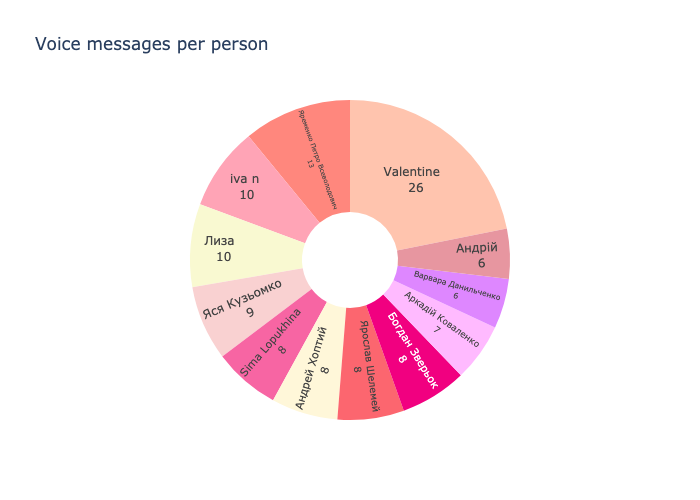

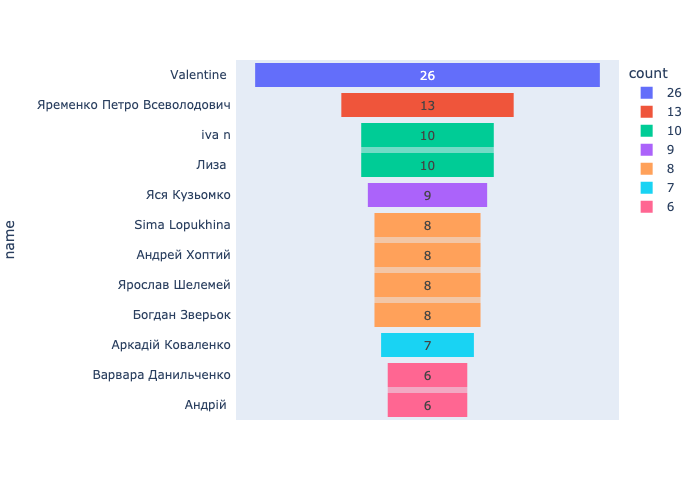

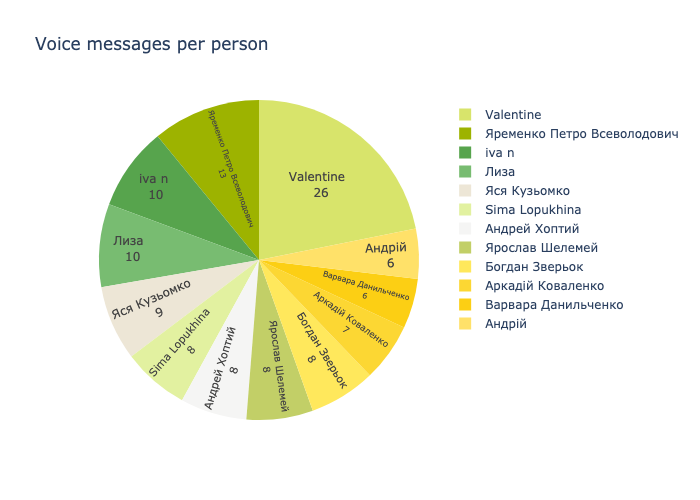

In [6]:
voice_df = df[df['from_id'].str.contains(my_id, na = False) == False]
voice_df = voice_df[voice_df['type'] == 'voice'];

voice_df = voice_df[voice_df['from_id'].str.contains('NaN') == False]
voice_df = voice_df[voice_df['to_id'].str.contains('NaN') == False]
voice_df['from_id'] = voice_df['from_id'].str.extract('(\d+)');
voice_df = voice_df.groupby(['from_id'])['from_id'].count().reset_index(name="count")



voice_df['name'] = voice_df['from_id'].apply(lambda x: find_row_by_id(x))
voice_df = voice_df.nlargest(12, ['count'])

colors_peach = ['#FFC4AE', '#FF877D', '#FFA4B6', '#F9F9D1', '#F9D1D1', '#F765A3', '#FFF7D9', '#FC666F', '#F10080', '#FFBAFF', '#DE87FF', '#E796A0']
fig = go.Figure()
fig = px.pie(voice_df, hole=.3, values='count', names='name', title = 'Voice messages per person')
fig.update_traces(textposition='inside', textinfo='value+label', marker=dict(colors=colors_peach))
fig.update(layout_showlegend=False)
fig.show(renderer='png')


fig = px.funnel(voice_df, x='count', y='name', color='count')
fig.show(renderer='png')

colors = ['#D8E46B', '#9DB300', '#57A44D', '#78BC71', '#EDE6D6', '#E2F1A0', '#F5F5F4', 'C2CF67', '#FFE85C', '#FCD733', '#FCCF14', '#FFE169']
fig = px.pie(voice_df, values='count', names='name', title = 'Voice messages per person', color='count')
fig.update_traces(textposition='inside', textinfo='value+label', marker=dict(colors=colors))
fig.show(renderer='png')

2. Stickers per person (in %)

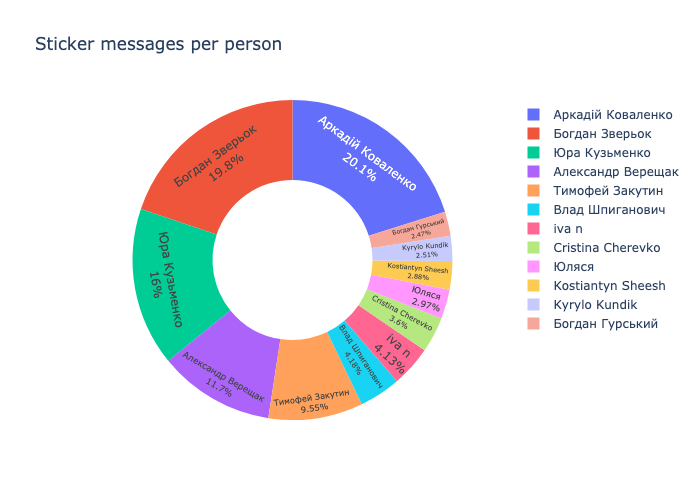

In [7]:
sticker_df = df[df['type'] == 'sticker'];
sticker_df = sticker_df.groupby(['from_id'])["type"].count().reset_index(name="count")
sticker_df['from_id'] = sticker_df['from_id'].str.extract('(\d+)');

sticker_df['name'] = sticker_df['from_id'].apply(lambda x: find_row_by_id(x))
sticker_df = sticker_df.nlargest(12, ['count'])
fig = px.pie(sticker_df, hole=.5, values='count', names='name', title = 'Sticker messages per person')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show(renderer='png')

3. Emoji frequency in all chats in telegram

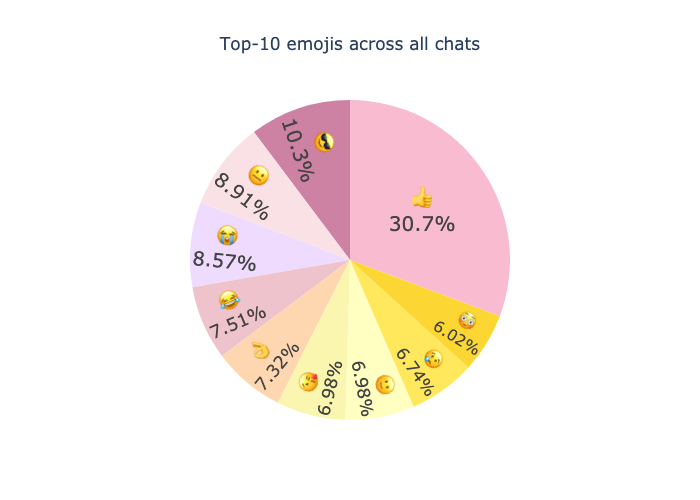

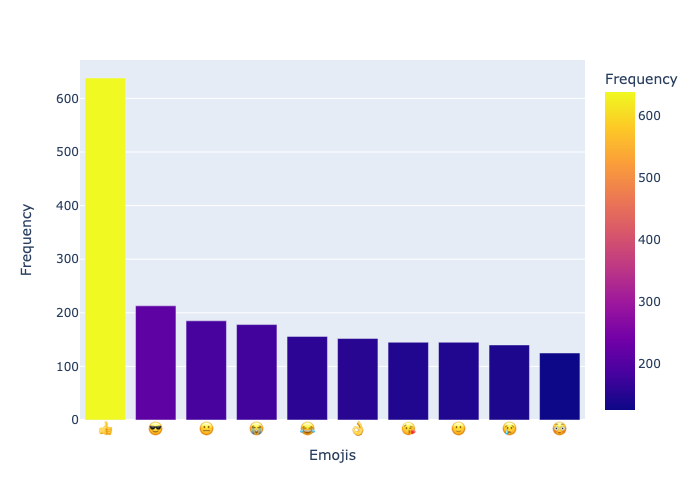

In [147]:
sticker_df = df[df['type'] == 'sticker'];
sticker_df = sticker_df.groupby(['message'])["message"].count().reset_index(name="count")
sticker_df = sticker_df.nlargest(10, ['count'])
emoji_df = pd.DataFrame(sticker_df, columns=['message', 'count'])
emoji_df.replace(to_replace='None', value=numpy.nan).dropna()
emoji_df.replace(to_replace=0, value=numpy.nan).dropna()

colors = ['#f8bbd0', '#cd82a4', '#f9e1e6', '#eedbfe', '#efc3cb', '#fed7b1', '#FAF6AF', '#FFFFC2', '#FFE85C', '#FCD733']
fig = px.pie(emoji_df, values='count', names='message', title = 'Top-10 emojis across all chats')
fig.update_traces(textposition='inside', textinfo='percent+label', textfont_size=20, marker =dict(colors=colors))
fig.update_layout(title_x=0.5)
fig.update(layout_showlegend=False)
fig.show(renderer='png')

fig = px.bar(emoji_df, x='message', y='count', labels={"message": "Emojis", "count": "Frequency"},
             hover_data=['message', 'count'], color='count',
             height=500)

fig.show(renderer='png')

4. Top-10 Emojis which I use the most

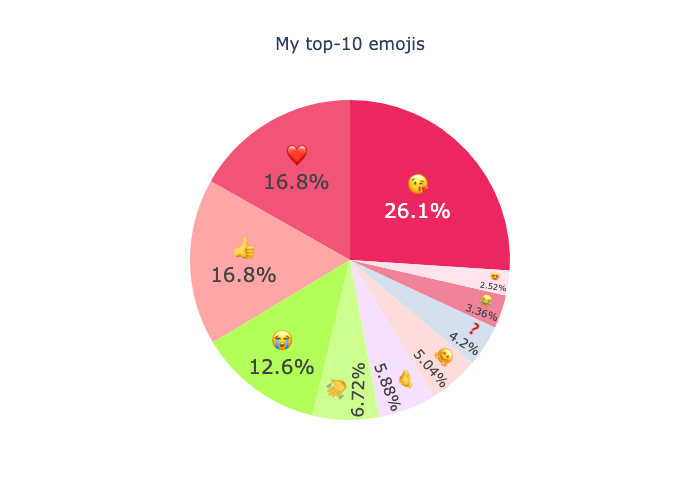

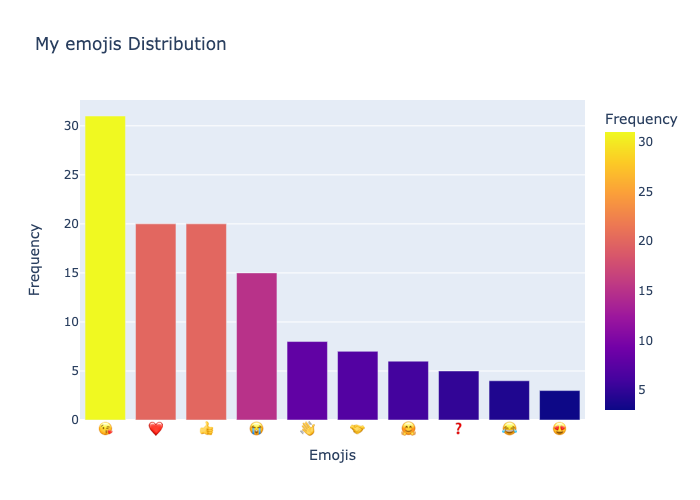

In [145]:
sticker_df = df[df['from_id'].str.contains(my_id, na = False)]
sticker_df = sticker_df[sticker_df['type'] == 'sticker'];
sticker_df = sticker_df.groupby(['message'])["message"].count().reset_index(name="count")
sticker_df = sticker_df.nlargest(10, ['count'])
emoji_df = pd.DataFrame(sticker_df, columns=['message', 'count'])
emoji_df.replace(to_replace='None', value=numpy.nan).dropna()
emoji_df.replace(to_replace=0, value=numpy.nan).dropna()

colors = ['#ec275f', '#f25477', '#ffa7a6', '#b2ff59', '#ccff90', '#F5E1FD', '#ffdcdc', '#d4e0ee', '#f0839a', '#ffe4ed']
fig = px.pie(emoji_df, values='count', names='message', title = 'My top-10 emojis')
fig.update_traces(textposition='inside', textinfo='percent+label', textfont_size=, marker = dict(colors=colors))
fig.update_layout(title_x=0.5)
fig.update(layout_showlegend=False)
fig.show(renderer='png')

fig = px.bar(emoji_df, x='message', y='count', labels={"message": "Emojis", "count": "Frequency"},
             hover_data=['message', 'count'], color='count',
             title='My emojis Distribution', height=500)
fig.show(renderer='png')

5. Word cloud for all chats in my telegram

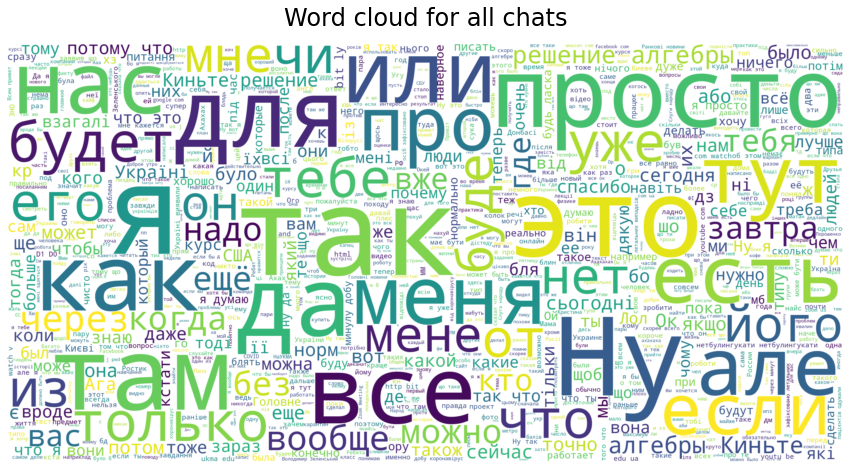

In [92]:
from wordcloud import WordCloud, STOPWORDS
text = df[df['message'].str.contains('NaN') == False]
word_string=" ".join(text['message'])
stopwords = ['в', 'і', 'и', 'та', 'с', 'то', 'но', 'у', 'по', 'як', 'а', 'це', 'до', 'не', 'на', 'за', 
             'з', 'https', 'goo', 'gl', 'www']
#stopwords
#stopwords.add(list_of_words)
plt.figure(figsize=(15,15))
wordcloud = WordCloud(background_color="white", stopwords=stopwords, max_words=1000, max_font_size = 450,  width=3000, height=1500)
wordcloud.generate(word_string)
plt.imshow(wordcloud.recolor( colormap= 'viridis' , random_state=17), interpolation="bilinear")
plt.title('Word cloud for all chats', fontsize='24', y = 1.03)
plt.axis('off')
plt.show()

6. My word cloud (most popular words that I use in my daily chats)

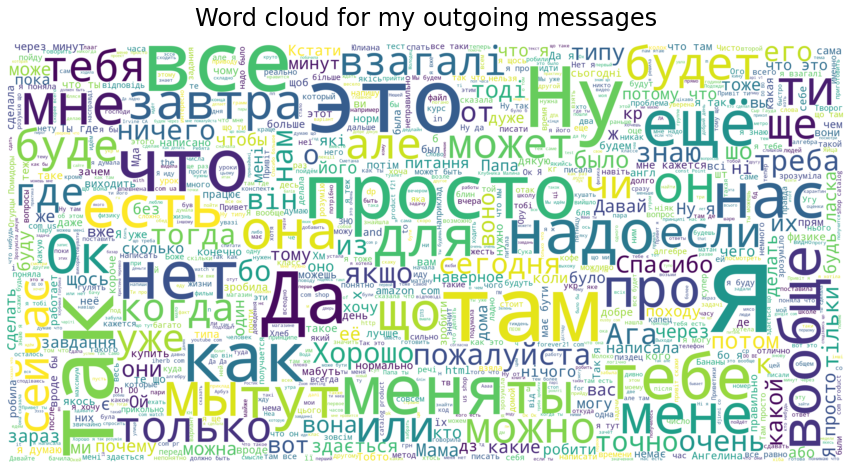

In [94]:
df_me = df[df['from_id'].str.contains(my_id, na = False)]
text = df_me[df_me['message'].str.contains('NaN') == False]
word_string=" ".join(text['message'])
plt.figure(figsize=(15,15))
wordcloud = WordCloud(background_color="white", stopwords=stopwords, max_words=1000, max_font_size = 450,  width=3000, height=1500)
wordcloud.generate(word_string)
plt.imshow(wordcloud.recolor( colormap= 'viridis' , random_state=17), interpolation="bilinear")
plt.title('Word cloud for my outgoing messages', fontsize='24', y = 1.03)
plt.axis('off')
plt.show()

7. Word cloud for all chats in my telegram without parasite words

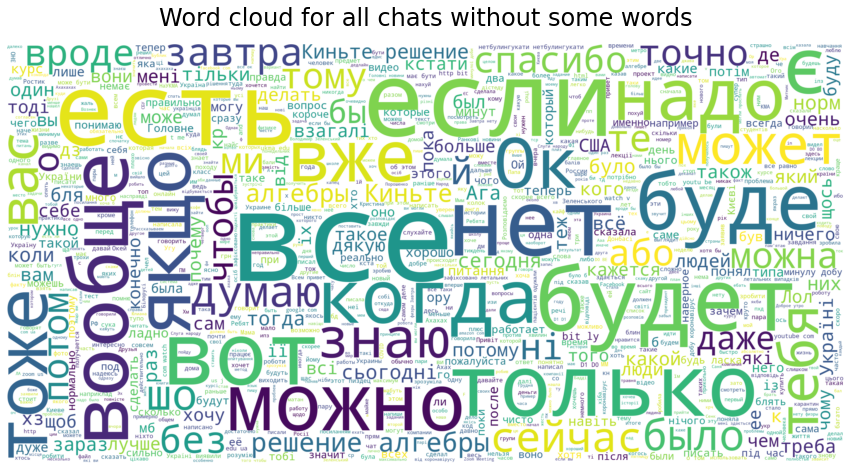

In [90]:
from wordcloud import WordCloud, STOPWORDS
text = df[df['message'].str.contains('NaN') == False]
word_string=" ".join(text['message'])
stopwords = ['в', 'і', 'и', 'та', 'с', 'то', 'но', 'у', 'по', 'як', 'а', 'це', 'до', 'не', 'за', 'так', 'ещё', 'уже', 'от',
             'https', 'goo', 'gl', 'www', 'ну', 'просто', 'типу', 'типо', 'да', 'на', 'тут', 'там', 'это', 'из', 'для', 'что',
            'или', 'чи', 'про', 'з', 'как', 'ще', 'що', 'вона', 'він', 'он', 'она', 'я', 'ты', 'ти', 'мене', 'мне', 'меня', 'нас',
            'його', 'они', 'нам', 'мы', 'же', 'тебе', 'где', 'бо', 'через', 'ж', 'але', 'кто', 'их', 'еще', 'его']
#stopwords
#stopwords.add(list_of_words)
plt.figure(figsize=(15,15))
wordcloud = WordCloud(background_color="white", stopwords=stopwords, max_words=1000, max_font_size = 450,  width=3000, height=1500)
wordcloud.generate(word_string)
plt.imshow(wordcloud.recolor( colormap= 'viridis' , random_state=17), interpolation="bilinear")
plt.title('Word cloud for all chats without some words', fontsize='24', y = 1.03)
plt.axis('off')
plt.show()

8. My word cloud without parasite words

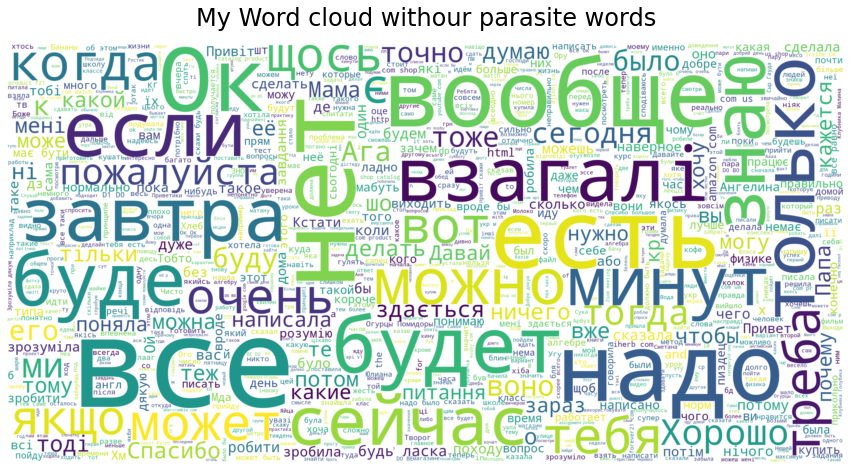

In [65]:
df_me = df[df['from_id'].str.contains(my_id, na = False)]
text = df_me[df_me['message'].str.contains('NaN') == False]
word_string=" ".join(text['message'])
plt.figure(figsize=(15,15))
wordcloud = WordCloud(background_color="white", stopwords=stopwords, max_words=1000, max_font_size = 450,  width=3000, height=1500)
wordcloud.generate(word_string)
plt.imshow(wordcloud.recolor( colormap= 'viridis' , random_state=17), interpolation="bilinear")
plt.title('My Word cloud withour parasite words', fontsize='24', y = 1.03)
plt.axis('off')
plt.show()

9. Number of messages per day of week. Hypothesis: most inactive days are Saturday and Sunday, because these days people usually spend with their families and friends. Proof - plot demonstates my statement. 


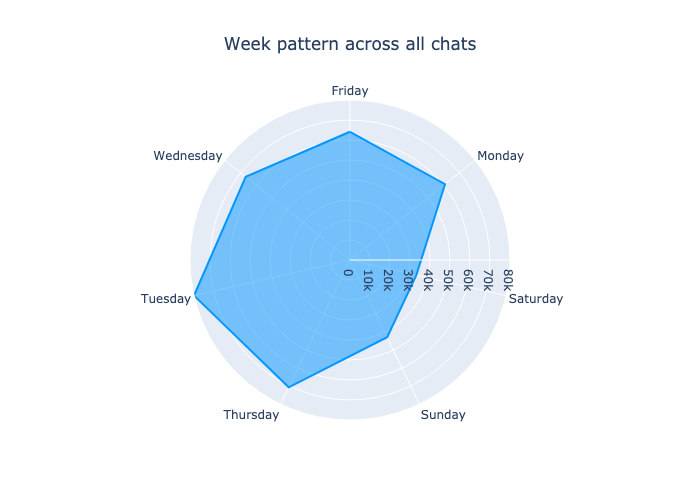

In [15]:
def dayofweek(i):
  week = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]
  return week[i];

new_df = pd.DataFrame(df, columns=['message', 'date'])
new_df = new_df.dropna()
day_df=pd.DataFrame(new_df['message'])
new_df["datetime"] = pd.to_datetime(new_df['date'])

day_df['week_day'] = new_df['datetime'].dt.weekday
day_df['week_day'] = day_df["week_day"].apply(dayofweek)
day_df["message_count"] = 1
day = day_df.groupby("week_day").sum()
day.reset_index(inplace=True)

fig = px.line_polar(day, r='message_count', theta='week_day', line_close=True, color_discrete_sequence=['#0496FF'], 
                    title='Week pattern across all chats' )
fig.update_traces(fill='toself')
fig.update_layout(title_x=0.5)
fig.update_layout(polar=dict(radialaxis=dict(visible=True)), showlegend=False)
fig.show(renderer='png')

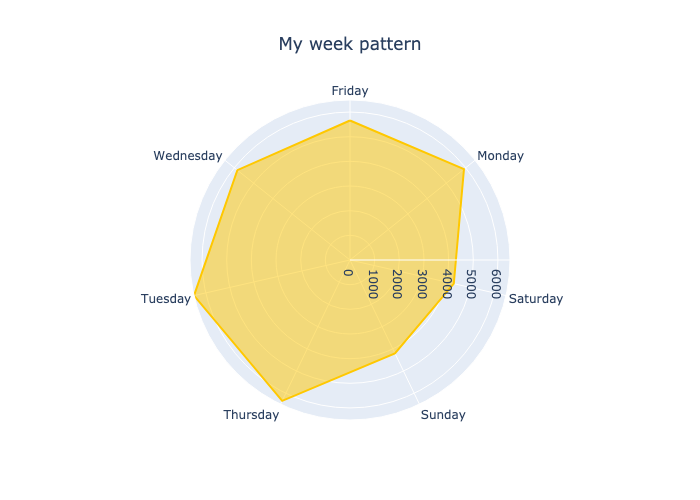

In [16]:
me = df[df['from_id'].str.contains(my_id, na = False)]
my_new_df = pd.DataFrame(me, columns=['message', 'date'])
my_new_df = my_new_df.dropna()
my_day_df = pd.DataFrame(my_new_df['message'])
my_new_df["datetime"] = pd.to_datetime(my_new_df['date'])

my_day_df['week_day'] = my_new_df['datetime'].dt.weekday
my_day_df['week_day'] = my_day_df["week_day"].apply(dayofweek)
my_day_df["message_count"] = 1
day = my_day_df.groupby("week_day").sum()
day.reset_index(inplace=True)

fig = px.line_polar(day, r='message_count', theta='week_day', line_close=True, color_discrete_sequence=['#FFC800'],
                   title='My week pattern')
fig.update_traces(fill='toself')
fig.update_layout(title_x=0.5)
fig.update_layout(polar=dict(radialaxis=dict(visible=True)), showlegend=False)
fig.show(renderer='png')

10. Number of words / time. In this question I calculate how "active" was my telegram through time. It is very interesting how my activity was pretty low through 2017 - middle of 2020 years and how it jumped at the end of 2020 - beginning of 2021

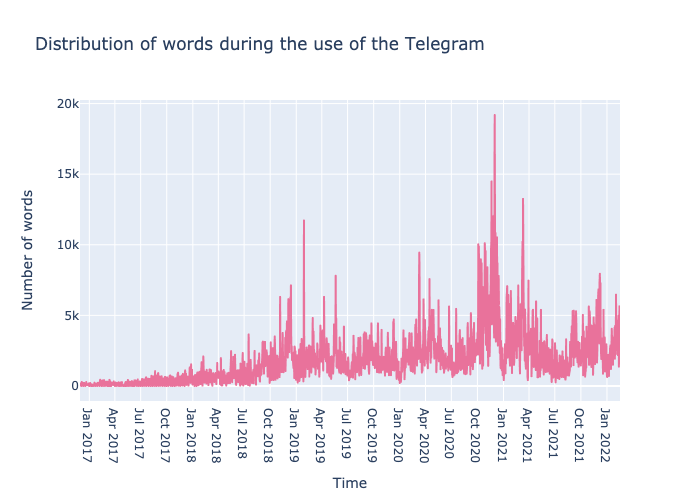

In [17]:
df_time = pd.DataFrame(df, columns=['date', 'message'])
df_time["word_count"] = df["message"].apply(lambda x: get_words_count(x))
df_time = df_time.dropna()
df_time["datetime"] = pd.to_datetime(df_time['date'])
df_time.index = df_time['datetime']
date_df_hello = df_time.resample("D").sum()
date_df_hello.reset_index(inplace=True)
fig = px.line(date_df_hello, x="datetime", y="word_count", color_discrete_sequence=['#E9729B'], 
              labels={"datetime": "Time", "word_count": "Number of words"}, 
              title='Distribution of words during the use of the Telegram')
fig.update_xaxes(nticks=30)
fig.show(renderer='png')

11. Number of words / time. In this question I calculate how "active" I was in chatting through time.

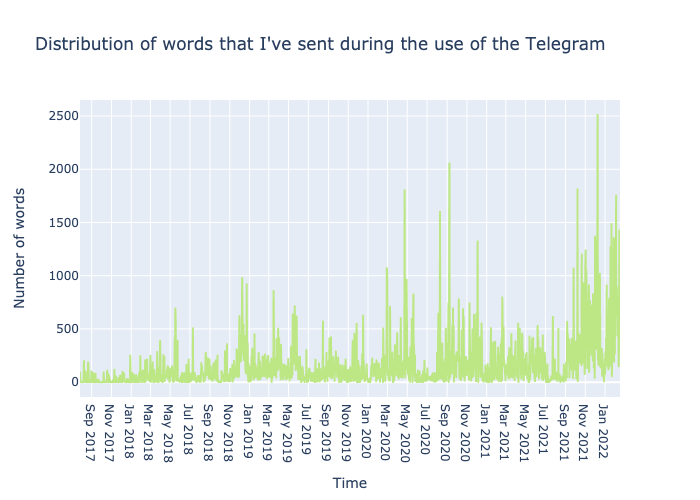

In [18]:
me = df[df['from_id'].str.contains(my_id, na = False)]
df_time = pd.DataFrame(me, columns=['date', 'message'])
df_time["word_count"] = df["message"].apply(lambda x: get_words_count(x))
df_time = df_time.dropna()
df_time["datetime"] = pd.to_datetime(df_time['date'])
df_time.index = df_time['datetime']
date_df_hello = df_time.resample("D").sum()
date_df_hello.reset_index(inplace=True)
fig = px.line(date_df_hello, x="datetime", y="word_count", color_discrete_sequence=['#BCE784'], 
              labels={"datetime": "Time", "word_count": "Number of words"},
              title='Distribution of words that I\'ve sent during the use of the Telegram')
fig.update_xaxes(nticks=30)
fig.show(renderer='png')

12. Distibution of messages by hour. This plot shows most active hours in telegram. There is almost even distribution between 8:00 - 20:00 every day, which is logical, because at this time I receive and send most of my messages.

<AxesSubplot:ylabel='hour'>

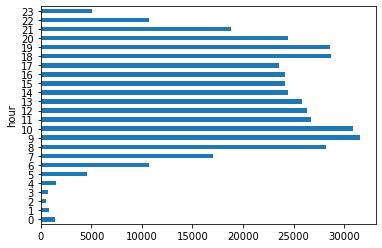

In [19]:
df_time = pd.DataFrame(df, columns=['date', 'message'])
df_time["message_count"] = 1
df_time = df_time.dropna()
df_time["datetime"] = pd.to_datetime(df_time['date'])
df_time.index = df_time['datetime']
df_time["hour"] = df_time.datetime.dt.hour
df_time.groupby("hour")["message_count"].sum().head(24).plot.barh()

13. Distribution of message (words) activity in Примати20х2 through day. Hypotesis - as most people are tend to spleep late at night, this means that activity will be at the lowest point between 1AM - 6AM.  

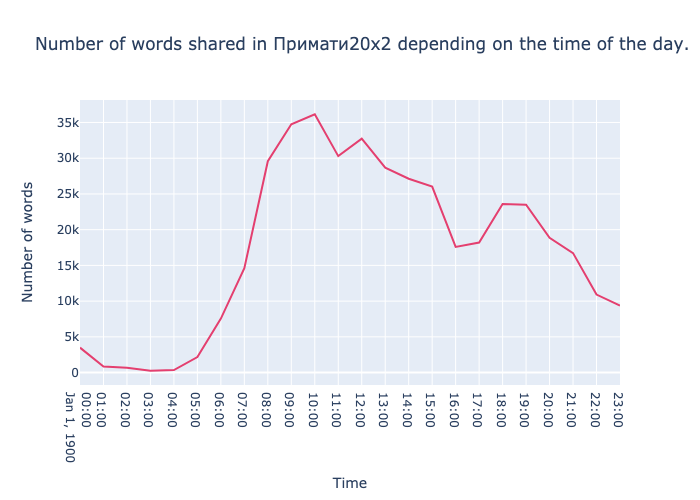

In [20]:
df_temp = df_meta[df_meta['name'] == 'Примати20х2']
group = df_meta.groupby('name', as_index=False).get_group('Примати20х2')
group_id = group.drop_duplicates(subset='dialog_id', keep='first')['dialog_id']
df_group = df.loc[df['dialog_id'].isin(group_id)]

df_time = pd.DataFrame(df_group, columns=['date', 'message'])
df_time["word_count"] = df_group["message"].apply(lambda x: get_words_count(x))
df_time = df_time.dropna()
df_time["datetime"] = pd.to_datetime(df_time['date'])
df_time['hours'] = df_time['datetime'].dt.hour
df_time['hours'] = pd.to_datetime(df_time['hours'], format='%H')
df_time.index = df_time['hours']

hello = df_time.resample('1H').sum()
hello.reset_index(inplace=True)

fig = px.line(hello, x="hours", y="word_count", color_discrete_sequence=['#E43F6F'], 
              labels={"hours": "Time", "word_count": "Number of words"},
              title='Number of words shared in Примати20х2 depending on the time of the day.')
fig.update_xaxes(nticks=30)
fig.show(renderer='png')

14. Count of messages shared through years (by month)

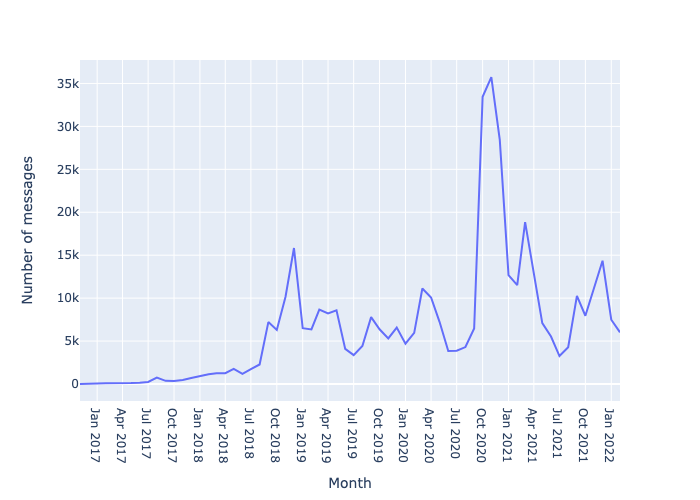

In [21]:
df_time = pd.DataFrame(df, columns=['date', 'message'])
df_time["message_count"] = 1
df_time = df_time.dropna()
df_time["datetime"] = pd.to_datetime(df_time['date'])
df_time['month'] = df_time['datetime']
df_time['month'] = df_time['month'].dt.strftime('%Y-%m')
date_df_hello = df_time.groupby('month')['month'].count().reset_index(name='count')
pd.set_option('display.max_rows', None)
fig = px.line(date_df_hello, x="month", y="count",
              labels={"month": "Month", "count": "Number of messages"})
fig.update_xaxes(nticks=30)
fig.show(renderer='png')

15. On the previous graph you can see that biggest amount of messages where sent in October and November, so I decided to investigate messages count in October and November 2020

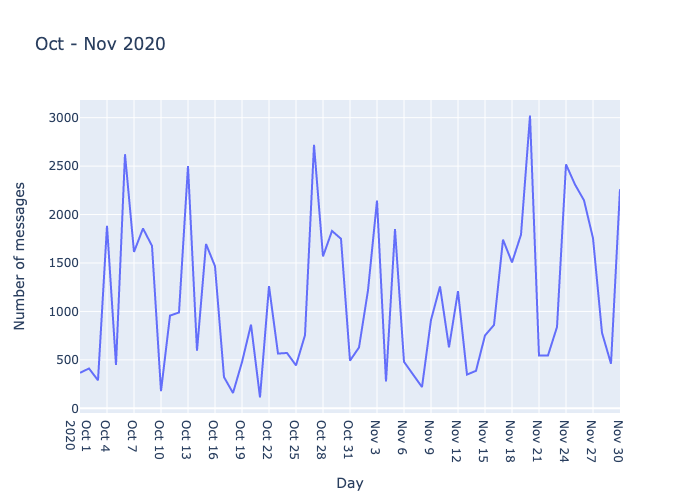

In [22]:
df_time = pd.DataFrame(df, columns=['date', 'message'])


df_time["message_count"] = 1
#df_time["word_count"] = df["message"].apply(lambda x: get_words_count(x))
df_time = df_time.dropna()
df_time["datetime"] = pd.to_datetime(df_time['date'])
df_time = df_time.loc[(df_time['datetime'] >= '2020-10-01') & (df_time['datetime'] < '2020-12-01')]
df_time['day'] = df_time['datetime'].dt.strftime('%Y-%m-%d')
#print(df_time)
#df_time['month'] = pd.to_datetime(df_time['month'], format='%Y-%m')
#print(df_time)
#df_time.index = df_time['month']
date_df_hello = df_time.groupby('day')['day'].count().reset_index(name='count')
#date_df_hello = df_time.resample("M").sum()

#print(date_df_hello)


fig = px.line(date_df_hello, x="day", y="count",
              labels={"day": "Day", "count": "Number of messages"}, title='Oct - Nov 2020')
fig.update_xaxes(nticks=30)
fig.show(renderer='png')

16. On the previous graph you can see that October and November where very active months, almost every day there was at least 1500 messages and maximum was on November 20 with 3021 message. As you will see below, the biggest amount of messages was in our university group - "Примати20х2" and in out faculty group - "ФІ". This day had the highest number of messages due to long discussion in "ФІ" group. In "Примати20х2" message activity was as usual. 

                      name  count
0                 Семья :)     18
1  Інгліш тікі без teacher     17
2     ДИСКРЕТНА МАТЕМАТИКА      1
3                    ФІ 49      1
4              Примати20х2   1816
5                       ФІ   1046
6                  Папочка      1
7        Cristina Cherevko      1
8              Лиза Андрич     86
9                    Юляся      1


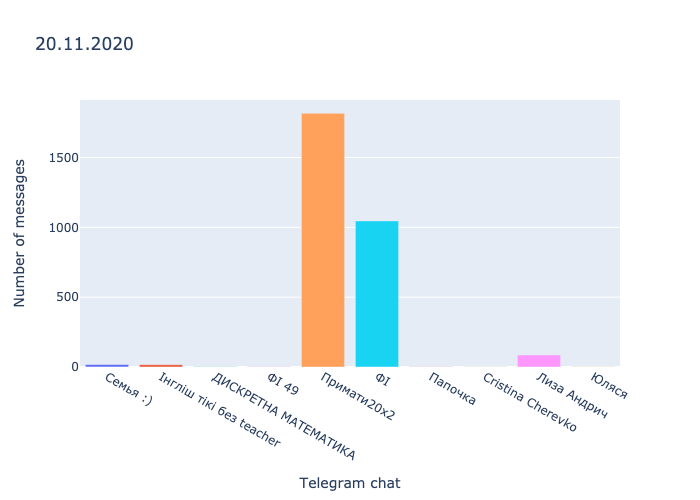

In [23]:
df_time = pd.DataFrame(df, columns=['date', 'dialog_id', 'message'])

df_time["message_count"] = 1
df_time = df_time.dropna()
df_time["datetime"] = pd.to_datetime(df_time['date'])
df_time = df_time.loc[(df_time['datetime'] >= '2020-11-20') & (df_time['datetime'] < '2020-11-21')]
df_time = df_time.groupby('dialog_id')['message'].count().reset_index(name='count')
df_merge = df_time.merge(df_meta, left_on='dialog_id', right_on='dialog_id', how='left')
df_merge = df_merge.dropna()
df_merge = df_merge.drop_duplicates(subset='dialog_id', keep='first').reset_index(drop=True)
print(df_merge[['name', 'count']])

fig = px.bar(df_merge, x="name", y="count", color='name', labels={'name': 'Telegram chat', 'count': 'Number of messages'}, 
             title='20.11.2020')
fig.update(layout_showlegend=False)
fig.show(renderer='png')

17. At the same time on graph 12, you can see that in January 2021 there was a very low activity (to say more, you can see that January month is always low in activity. And, to go deeper, I found out that there is always a specific spike from middle of November to January (see graph 12 for 2018, 2019, 2020, 2021 years)).
Getting back to January month I wanted to investigate in a little bit closer, so I took a look on January 1 - january 31 2021 period

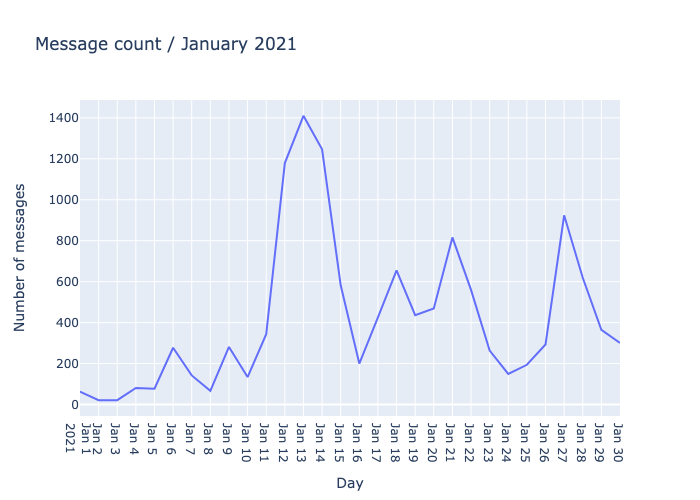

In [24]:
df_time = pd.DataFrame(df, columns=['date', 'message'])
df_time["message_count"] = 1
df_time = df_time.dropna()
df_time["datetime"] = pd.to_datetime(df_time['date'])
df_time = df_time.loc[(df_time['datetime'] >= '2021-01-01') & (df_time['datetime'] < '2021-01-31')]
df_time['day'] = df_time['datetime'].dt.strftime('%Y-%m-%d')

date_df_hello = df_time.groupby('day')['day'].count().reset_index(name='count')

fig = px.line(date_df_hello, x="day", y="count",
              labels={"day": "Day", "count": "Number of messages"}, title='Message count / January 2021')
fig.update_xaxes(nticks=30)
fig.show(renderer='png')

18. As you see on graph 15, the most active day was January 13 and the lowest activity was in January 1 - January 4. There is a very simple sxplanation for both of these activities. January 1-4 are days right after New Year, so they are always very low on activity, because people usually sleeping and eating these days😅. On the other hand January 13 is one of the first days of spring semester, so our course group ("Примати20х2") is getting back to life. My conjectures are proven by plots below.

          name  count
0     Семья :)     14
1  Примати20х2     36
2           ФІ     15
3      Папочка      1
4      Мамочка      1
5        Юляся      1


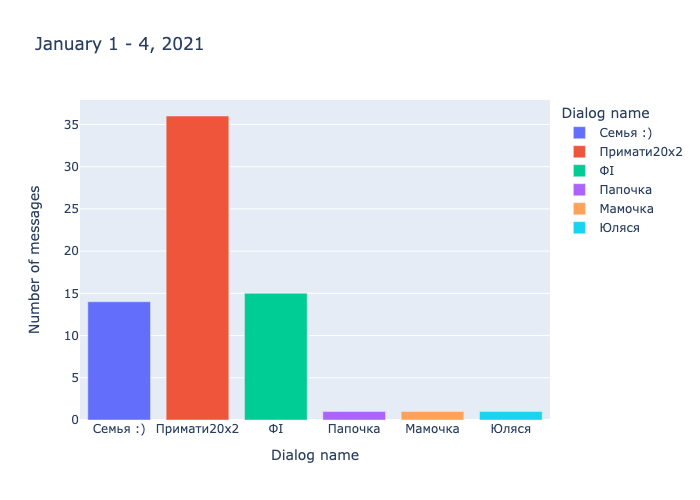

In [25]:
df_time = pd.DataFrame(df, columns=['date', 'dialog_id', 'message'])

df_time["message_count"] = 1
df_time = df_time.dropna()
df_time["datetime"] = pd.to_datetime(df_time['date'])
df_time = df_time.loc[(df_time['datetime'] >= '2021-01-01') & (df_time['datetime'] < '2021-01-04')]
df_time = df_time.groupby('dialog_id')['message'].count().reset_index(name='count')
df_merge = df_time.merge(df_meta, left_on='dialog_id', right_on='dialog_id', how='left')
df_merge = df_merge.dropna()
df_merge = df_merge.drop_duplicates(subset='dialog_id', keep='first').reset_index(drop=True)
print(df_merge[['name', 'count']])

fig = px.bar(df_merge, x="name", y="count", color='name', title="January 1 - 4, 2021",
            labels={'name': 'Dialog name', 'count': 'Number of messages'})
fig.show(renderer='png')

                   name  count
0              Семья :)      3
1  ДИСКРЕТНА МАТЕМАТИКА     26
2             Колоквіум     17
3           Примати20х2   1174
4                    ФІ    118
5               Папочка     10
6               Мамочка     10
7     Cristina Cherevko      6
8           Лиза Андрич     25


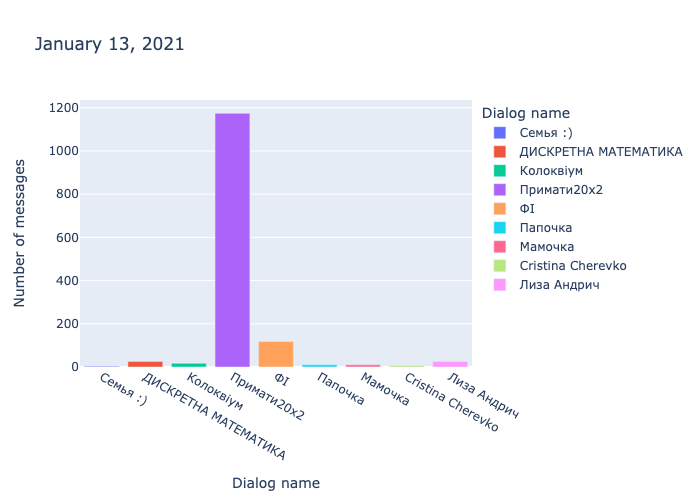

In [26]:
df_time = pd.DataFrame(df, columns=['date', 'dialog_id', 'message'])

df_time["message_count"] = 1
df_time = df_time.dropna()
df_time["datetime"] = pd.to_datetime(df_time['date'])
df_time = df_time.loc[(df_time['datetime'] >= '2021-01-13') & (df_time['datetime'] < '2021-01-14')]
df_time = df_time.groupby('dialog_id')['message'].count().reset_index(name='count')
df_merge = df_time.merge(df_meta, left_on='dialog_id', right_on='dialog_id', how='left')
df_merge = df_merge.dropna()
df_merge = df_merge.drop_duplicates(subset='dialog_id', keep='first').reset_index(drop=True)
print(df_merge[['name', 'count']])

fig = px.bar(df_merge, x="name", y="count", color='name', title="January 13, 2021",
            labels={'name': 'Dialog name', 'count': 'Number of messages'})
fig.show(renderer='png')

19. Top-15 people with the biggest average length of messages sent.

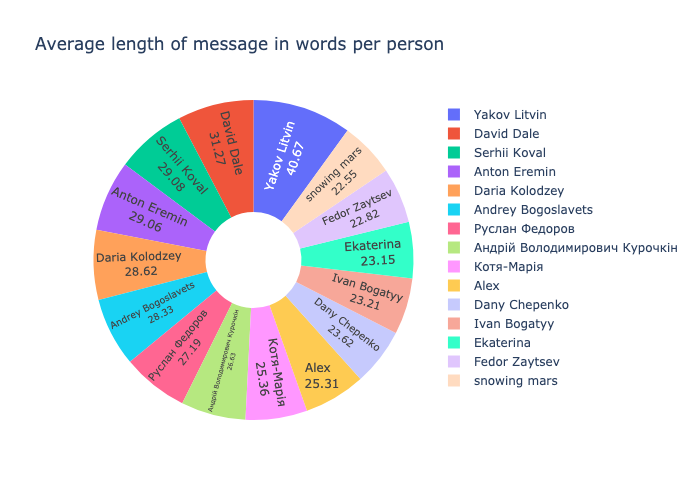

In [27]:
people = df['from_id'].str.extract('(\d+)')
people = people.drop_duplicates()
hello = df
hello.dropna()
hello['word_count'] = hello['message'].apply(lambda x: get_words_count(x))
hello['from_id'] = hello['from_id'].str.extract('(\d+)')
hello = hello[hello['from_id'].str.contains('NaN') == False]
df_apply = pd.DataFrame(hello, columns = ['from_id', 'word_count', 'message'])
df_apply = df_apply.dropna()

df_to_paint = pd.DataFrame(columns = ['from_id', 'word_count', 'number_of_messages', 'average_length'])
for id in people[0]:
    user_df = df_apply[df_apply["from_id"] == id]
    words_per_message = user_df['word_count'].sum()
    if (user_df.shape[0] != 0):
        new_df = pd.DataFrame([(id, words_per_message, user_df.shape[0], round(words_per_message/user_df.shape[0], 2))], columns = ('from_id', 'word_count', 'number_of_messages', 'average_length'))
        df_to_paint = df_to_paint.append(new_df, ignore_index = True)
        df_to_paint.reset_index(drop = True)


res = pd.DataFrame(df_to_paint, columns = ['from_id', 'average_length'])
res['temp'] = 1;
res = res.groupby(['from_id'])['temp'].count().reset_index(name='count')
res['name'] = res['from_id'].apply(lambda x: find_row_by_id(x))
res = res.dropna()
newdf = df_to_paint.merge(res)
newdf.dropna()
newdf = newdf.sort_values('average_length')
newdf = newdf[newdf['number_of_messages'] > 10]
newdf = newdf.nlargest(15, 'average_length')
fig = px.pie(newdf, hole=.3, values='average_length', names='name', title = 'Average length of message in words per person')
fig.update_traces(textposition='inside', textinfo='value+label')
fig.show(renderer='png')

20. Top-15 people with the biggest average length of messages sent in group "Примати20х2".

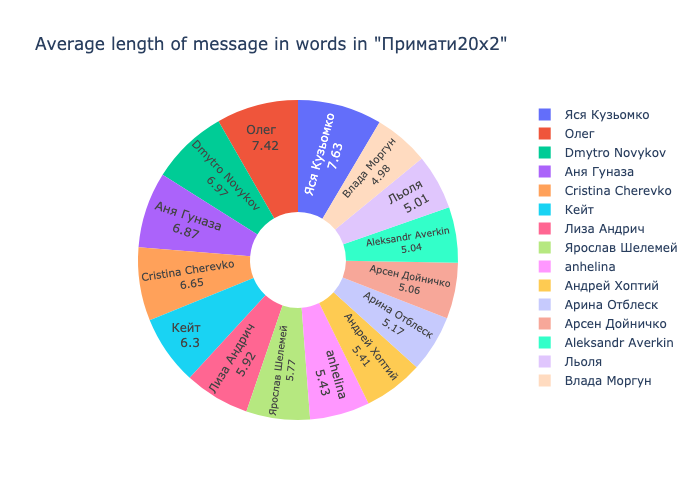

In [28]:
df_temp = df_meta[df_meta['name'] == 'Примати20х2']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
primates = df[df['dialog_id'] == group_id]

people = primates['from_id'].str.extract('(\d+)')
people = people.drop_duplicates()
hello = df
hello.dropna()
hello['word_count'] = hello['message'].apply(lambda x: get_words_count(x))
hello['from_id'] = hello['from_id'].str.extract('(\d+)')
hello = hello[hello['from_id'].str.contains('NaN') == False]
df_apply = pd.DataFrame(hello, columns = ['from_id', 'word_count', 'message'])
df_apply = df_apply.dropna()

df_to_paint = pd.DataFrame(columns = ['from_id', 'word_count', 'number_of_messages', 'average_length'])
for id in people[0]:
    user_df = df_apply[df_apply["from_id"] == id]
    words_per_message = user_df['word_count'].sum()
    if (user_df.shape[0] != 0):
        new_df = pd.DataFrame([(id, words_per_message, user_df.shape[0], round(words_per_message/user_df.shape[0], 2))], columns = ('from_id', 'word_count', 'number_of_messages', 'average_length'))
        df_to_paint = df_to_paint.append(new_df, ignore_index = True)
        df_to_paint.reset_index(drop = True)

res = pd.DataFrame(df_to_paint, columns = ['from_id', 'average_length'])
res['temp'] = 1;
res = res.groupby(['from_id'])['temp'].count().reset_index(name='count')
res['name'] = res['from_id'].apply(lambda x: find_row_by_id(x))
res = res.dropna()
newdf = df_to_paint.merge(res)

newdf.dropna()
newdf = newdf.sort_values('average_length')
newdf = newdf[newdf['number_of_messages'] != 1]

newdf = newdf.nlargest(15, 'average_length')
fig = px.pie(newdf, hole=.3, values='average_length', names='name', title = 'Average length of message in words in \"Примати20х2\"')
fig.update_traces(textposition='inside', textinfo='value+label')
fig.show(renderer='png')

21. Gender distribution across all my chats.

/var/folders/rp/vwfb10854bnbsyfl97kd408m0000gn/T/ipykernel_66282/4219444514.py:49: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



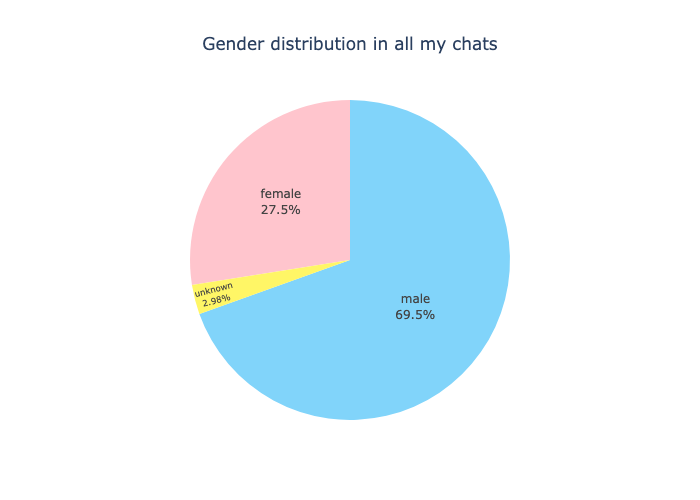

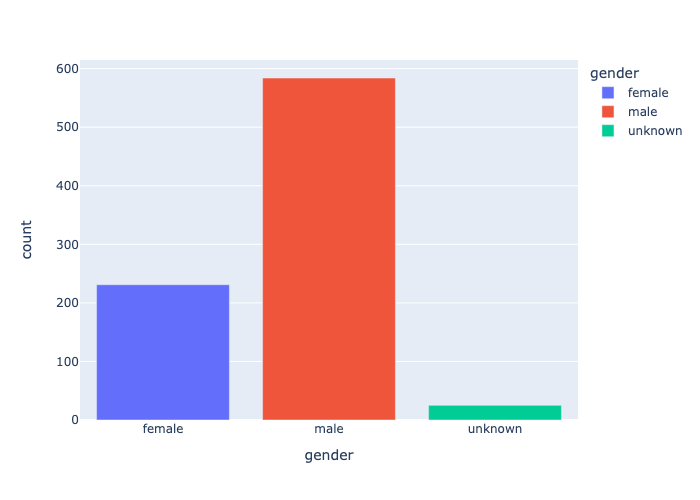

In [29]:
def find_gender(string):
    if ~(string).isdecimal():
        count_female = 0;
        count_male = 0
        words = string.replace('_', ' ').replace(',', ' ').replace('.', ' ').replace('\(', ' ').replace('+', ' ').replace('\)', ' ').split()
        for word in words:
            for fem_name in gender['female_names']:
                if ((word == fem_name)):
                    return 'female';
            for m_name in gender['male_names']:
                if ((word == m_name)):
                    return 'male';
            for f_ending in gender['female']:
                if (word.endswith(f_ending)):
                    count_female+=1;
            for m_ending in gender['male']:
                if (word.endswith(m_ending) & (word.lower() != 'успіхів') & (word.lower() != 'сотрудников') & (word.lower() != 'архів') & (word.lower() != 'біткоїнів')):
                    count_male+=1;
        if (count_female > count_male):
            return 'female';
        if (count_female < count_male):
            return 'male';
        return 'unknown'
def find_gender_by_name(x):
    for f_n in gender['f_names']:
        if ((f_n) in str(x).lower()):
            return 'female';
    for m_n in gender['m_names']:
        if ((m_n) in str(x).lower()):
            return 'male';
    return 'unknown';

gender_df = pd.DataFrame(df, columns = ['from_id', 'message', 'type']);
gender_df = gender_df[gender_df['type'] == 'text'].reset_index(drop = True)

gender_df = gender_df[gender_df['from_id'].str.contains('NaN') == False]
gender_df = gender_df[gender_df['message'].str.contains('NaN') == False]
gender_df['from_id'] = gender_df['from_id'].str.extract('(\d+)');
gender_df = gender_df.dropna()
gender_df['message'] = gender_df.groupby('from_id')['message'].transform(lambda x: ' '.join(x))

gender_df = gender_df.drop_duplicates(subset='from_id', keep='first')

gender_df['name'] = gender_df['from_id'].apply(lambda x: find_row_by_id_u(x))

gender_df['gender'] = gender_df['name'].apply(lambda x: find_gender_by_name(x))

unknown_gender = gender_df[gender_df['gender'] == 'unknown']
unknown_gender['gender'] = unknown_gender['message'].apply(lambda x: find_gender(x))

gender_df = gender_df.append(unknown_gender)


gender_df = gender_df.drop_duplicates(subset=['from_id', 'name'], keep = 'last')
gender_df = gender_df.dropna()
count = gender_df.groupby('gender')['gender'].count().reset_index(name='count')


fig = go.Figure()
fig = px.pie(count, values='count', names='gender', title = 'Gender distribution in all my chats', color=['female', 'male', 'unknown'],
             color_discrete_map={'female':'rgb(255, 197, 205)',
                                 'male':'rgb(129, 212, 250)',
                                 'unknown':'rgb(255, 246, 102)'})
fig.update_layout(title_x=0.5)
fig.update(layout_showlegend=False)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show(renderer='png')


fig = px.bar(count, x="gender", y="count", color='gender')
fig.show(renderer='png')

22. Below you will see gender analysis for all chats. My main goal was to see how different the ratio of women / men in the course and faculty groups.

/var/folders/rp/vwfb10854bnbsyfl97kd408m0000gn/T/ipykernel_66282/2763707149.py:18: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



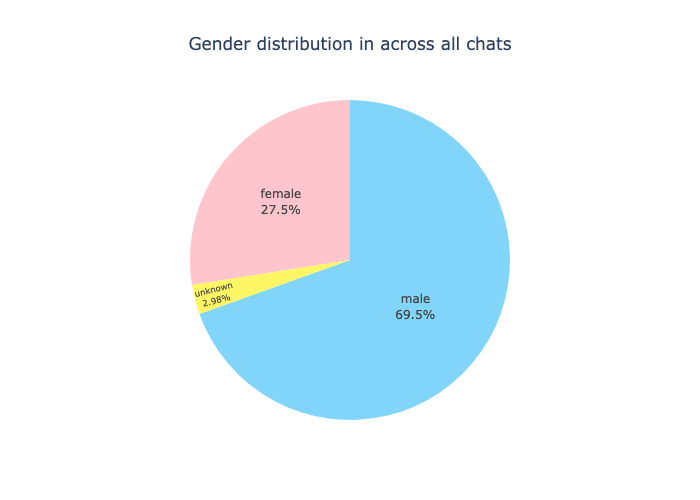

In [104]:

all_people = df
gender_df = pd.DataFrame(all_people, columns = ['from_id', 'message', 'type']);
gender_df = gender_df[gender_df['type'] == 'text'].reset_index(drop = True)

gender_df = gender_df[gender_df['from_id'].str.contains('NaN') == False].reset_index(drop = True)
gender_df = gender_df[gender_df['message'].str.contains('NaN') == False].reset_index(drop = True)
gender_df['from_id'] = gender_df['from_id'].str.extract('(\d+)');
gender_df = gender_df.dropna()
gender_df['message'] = gender_df.groupby('from_id')['message'].transform(lambda x: ' '.join(x)).reset_index(drop = True)

gender_df = gender_df.drop_duplicates(subset='from_id', keep='first')

gender_df['name'] = gender_df['from_id'].apply(lambda x: find_row_by_id_u(x))

gender_df['gender'] = gender_df['name'].apply(lambda x: find_gender_by_name(x))

unknown_gender = gender_df[gender_df['gender'] == 'unknown']
unknown_gender['gender'] = unknown_gender['message'].apply(lambda x: find_gender(x))

gender_df = gender_df.append(unknown_gender)


gender_df = gender_df.drop_duplicates(subset=['from_id', 'name'], keep = 'last')
gender_df = gender_df.dropna()

count = gender_df.groupby('gender')['gender'].count().reset_index(name='count')


fig = go.Figure()
fig = px.pie(count, values='count', names='gender', title = 'Gender distribution in across all chats', color=['female', 'male', 'unknown'],
             color_discrete_map={'female':'rgb(255, 197, 205)',
                                 'male':'rgb(129, 212, 250)',
                                 'unknown':'rgb(255, 246, 102)'})
fig.update_layout(title_x=0.5)
fig.update(layout_showlegend=False)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show(renderer='png')

23. Below you will see gender analysis for 2 group "ФІ" and "Примати20х2". My main goal was to see how different the ratio of women / men in the course and faculty groups.

/var/folders/rp/vwfb10854bnbsyfl97kd408m0000gn/T/ipykernel_66282/849092947.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



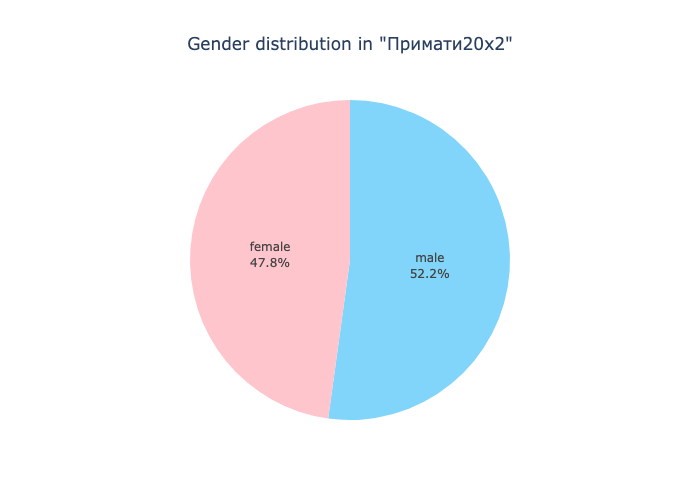

In [30]:
df_temp = df_meta[df_meta['name'] == 'Примати20х2']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
primates = df[df['dialog_id'] == group_id]
gender_df = pd.DataFrame(primates, columns = ['from_id', 'message', 'type']);
gender_df = gender_df[gender_df['type'] == 'text'].reset_index(drop = True)

gender_df = gender_df[gender_df['from_id'].str.contains('NaN') == False].reset_index(drop = True)
gender_df = gender_df[gender_df['message'].str.contains('NaN') == False].reset_index(drop = True)
gender_df['from_id'] = gender_df['from_id'].str.extract('(\d+)');
gender_df = gender_df.dropna()
gender_df['message'] = gender_df.groupby('from_id')['message'].transform(lambda x: ' '.join(x)).reset_index(drop = True)

gender_df = gender_df.drop_duplicates(subset='from_id', keep='first')

gender_df['name'] = gender_df['from_id'].apply(lambda x: find_row_by_id_u(x))

gender_df['gender'] = gender_df['name'].apply(lambda x: find_gender_by_name(x))

unknown_gender = gender_df[gender_df['gender'] == 'unknown']
unknown_gender['gender'] = unknown_gender['message'].apply(lambda x: find_gender(x))

gender_df = gender_df.append(unknown_gender)


gender_df = gender_df.drop_duplicates(subset=['from_id', 'name'], keep = 'last')
gender_df = gender_df.dropna()

count = gender_df.groupby('gender')['gender'].count().reset_index(name='count')


fig = go.Figure()
fig = px.pie(count, values='count', names='gender', title = 'Gender distribution in \"Примати20х2\"', color=['female', 'male'],
             color_discrete_map={'female':'rgb(255, 197, 205)',
                                 'male':'rgb(129, 212, 250)'})
fig.update_layout(title_x=0.5)
fig.update(layout_showlegend=False)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show(renderer='png')



/var/folders/rp/vwfb10854bnbsyfl97kd408m0000gn/T/ipykernel_66282/1863833073.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



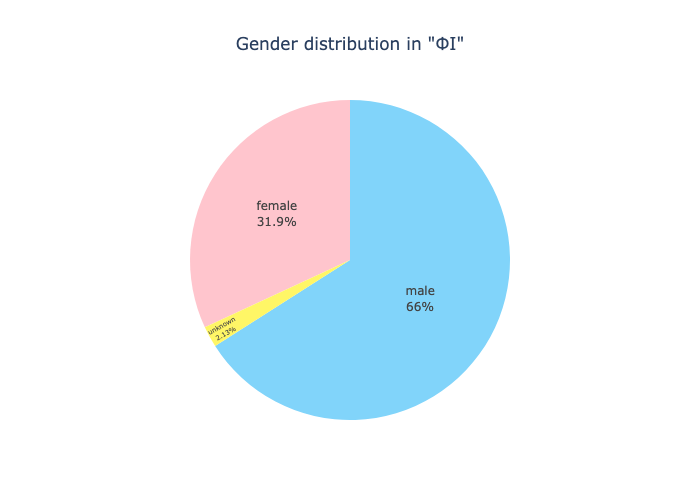

In [100]:
df_temp = df_meta[df_meta['name'].str.contains('ФІ')]
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
primates = df[df['dialog_id'] == group_id]
gender_df = pd.DataFrame(primates, columns = ['from_id', 'message', 'type']);
gender_df = gender_df[gender_df['type'] == 'text'].reset_index(drop = True)

gender_df = gender_df[gender_df['from_id'].str.contains('NaN') == False].reset_index(drop = True)
gender_df = gender_df[gender_df['message'].str.contains('NaN') == False].reset_index(drop = True)
gender_df['from_id'] = gender_df['from_id'].str.extract('(\d+)');
gender_df = gender_df.dropna()
gender_df['message'] = gender_df.groupby('from_id')['message'].transform(lambda x: ' '.join(x)).reset_index(drop = True)

gender_df = gender_df.drop_duplicates(subset='from_id', keep='first')

gender_df['name'] = gender_df['from_id'].apply(lambda x: find_row_by_id_u(x))

gender_df['gender'] = gender_df['name'].apply(lambda x: find_gender_by_name(x))

unknown_gender = gender_df[gender_df['gender'] == 'unknown']
unknown_gender['gender'] = unknown_gender['message'].apply(lambda x: find_gender(x))

gender_df = gender_df.append(unknown_gender)


gender_df = gender_df.drop_duplicates(subset=['from_id', 'name'], keep = 'last')
gender_df = gender_df.dropna()

count = gender_df.groupby('gender')['gender'].count().reset_index(name='count')


fig = go.Figure()
fig = px.pie(count, values='count', names='gender', title = 'Gender distribution in \"ФІ\"', color=['female', 'male', 'unknown'],
             color_discrete_map={'female':'rgb(255, 197, 205)',
                                 'male':'rgb(129, 212, 250)',
                                 'unknown':'rgb(255, 246, 102)'})
fig.update_layout(title_x=0.5)
fig.update(layout_showlegend=False)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show(renderer='png')


24. Sent and received messages

/var/folders/rp/vwfb10854bnbsyfl97kd408m0000gn/T/ipykernel_66282/365142501.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/rp/vwfb10854bnbsyfl97kd408m0000gn/T/ipykernel_66282/365142501.py:5: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



<AxesSubplot:xlabel='date'>

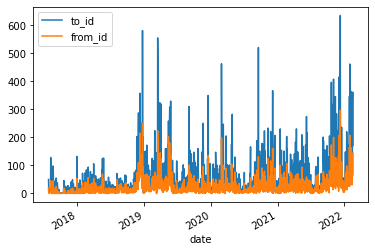

In [32]:
from datetime import datetime
df_temp = df[df["from_id"].str.contains(my_id, na=False) | df["to_id"].str.contains(my_id, na = False)]
df_temp['date'] = (df_temp['date']).apply(lambda x: (datetime.strptime(x[0:10], "%Y-%m-%d"))) 
result = pd.DataFrame(df_temp, columns=['date', 'to_id', 'from_id'])
result = result.groupby(['date'])['to_id', 'from_id'].count()
result[['to_id','from_id']].plot()

25. Top-10 people who writes me the most

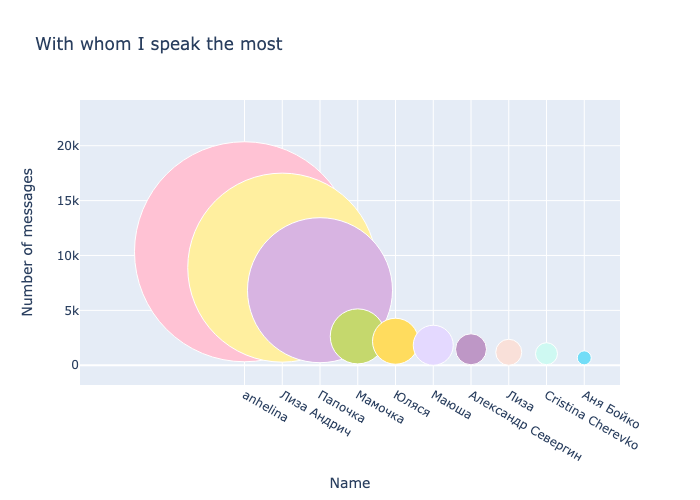

In [33]:
df_received = df[df["to_id"].str.contains(my_id,na=True)]
df_received = df_received.groupby(['dialog_id'])['message'].count().reset_index(name="count")
df_received = df_received.nlargest(10, ['count'])
df_received = df_received.merge(df_meta, left_on=['dialog_id'], right_on=['dialog_id'], how = 'inner')
df_received[['name', 'count']]

df_people = pd.DataFrame(df_received, columns=['name', 'count'])
fig = go.Figure(data=[go.Scatter(
    x=df_people['name'], y=df_people['count'], mode='markers',
    marker=dict(color=['#ffc2d4', '#ffef9f', '#D8B4E2','#C5D86D', '#FFDC5E', '#E4D9FF', '#BE97C6', '#F9E0D9', '#CEF9F2', '#72DDF7'],
        opacity=1,
        size=[220, 189, 145, 55, 46, 40, 31, 26, 22, 14],
    ))
])

fig.update_layout(xaxis_title="Name", yaxis_title="Number of messages", title='With whom I speak the most')

fig.show(renderer='png')

26. Mood of people in "Примати20х2" based on emoji messages

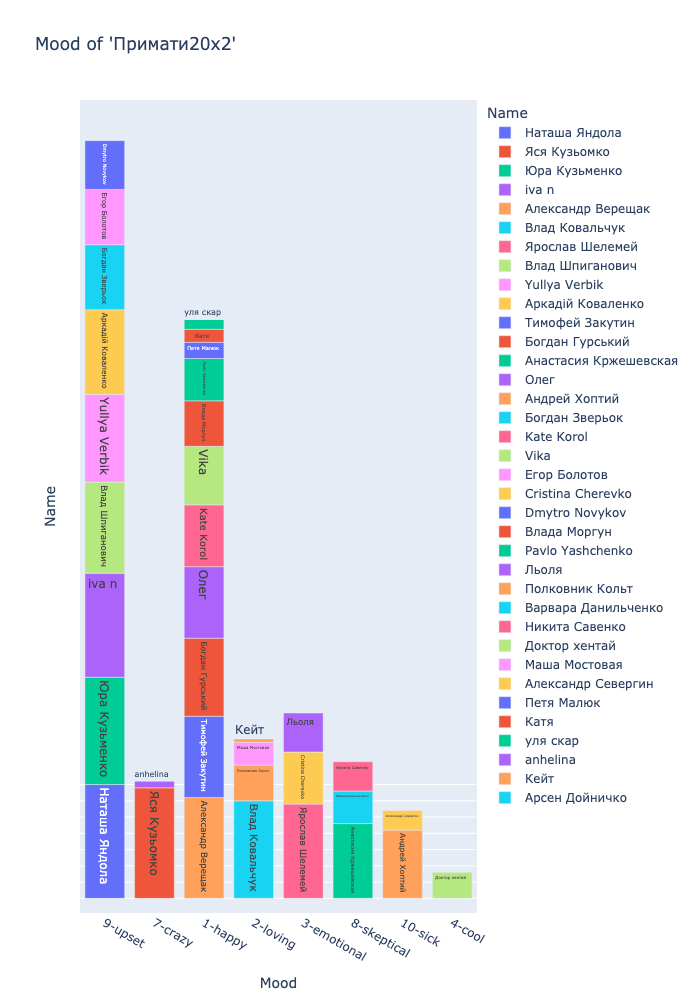

In [34]:
def find_mood(x):
    count_happy = 0
    count_angry = 0
    count_love = 0
    count_crazy = 0
    count_thoughtful = 0
    count_skeptical = 0
    count_cool = 0
    count_emotional = 0
    count_sleepy = 0
    count_sick = 0
    count_upset = 0
    for emoji in x.tolist():
        if (emoji in mood_emojis['happy']):
            count_happy += 1
        if (emoji in mood_emojis['angry']):
            count_angry += 1
        if (emoji in mood_emojis['love']):
            count_love += 1
        if (emoji in mood_emojis['crazy']):
            count_crazy += 1
        if (emoji in mood_emojis['thoughtful']):
            count_thoughtful += 1
        if (emoji in mood_emojis['skeptical']):
            count_skeptical += 1
        if (emoji in mood_emojis['cool']):
            count_cool += 1
        if (emoji in mood_emojis['emotional']):
            count_emotional += 1
        if (emoji in mood_emojis['sleepy']):
            count_sleepy += 1
        if (emoji in mood_emojis['sick']):
            count_sick += 1
        if (emoji in mood_emojis['upset']):
            count_upset += 1
    max_value = max([count_happy, count_angry, count_love, count_crazy, count_thoughtful, count_skeptical,
                    count_cool, count_emotional, count_sleepy, count_sick, count_upset])
    if (max_value == count_happy):
        return ('1-happy')
    if (max_value == count_angry):
        return '11-angry'
    if (max_value == count_love):
        return '2-loving'
    if (max_value == count_crazy):
        return '7-crazy'
    if (max_value == count_thoughtful):
        return '5-thoughtful'
    if (max_value == count_skeptical):
        return '8-skeptical'
    if (max_value == count_cool):
        return '4-cool'
    if (max_value == count_emotional):
        return '3-emotional'
    if (max_value == count_sleepy):
        return '6-sleepy'
    if (max_value == count_sick):
        return '10-sick'
    if (max_value == count_upset):
        return '9-upset'  

df_temp = df_meta[df_meta['name'] == 'Примати20х2']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
primates = df[df['dialog_id'] == group_id]
primates = primates[primates['type'] == 'sticker']
primates = primates[primates['from_id'].str.contains('NaN') == False]
primates = primates[primates['message'].str.contains('NaN') == False]


primates['from_id'] = primates['from_id'].str.extract('(\d+)');

primates['mood'] = primates.groupby('from_id')['message'].transform(lambda x: find_mood(x))

primates = primates.drop_duplicates(subset='from_id', keep='first')

primates['name'] = primates['from_id'].apply(lambda x: find_row_by_id(x))
primates = primates[primates['name'].str.contains('NaN') == False]



fig = px.bar(primates, x='mood', y='name',
             hover_data=['mood', 'name'], color='name',  text_auto=True,
             labels={'mood':'Mood', 'name': 'Name'}, title= 'Mood of \'Примати20х2\'', height=1000)
fig.update_yaxes(showticklabels=False)
fig.show(renderer='png')


27. Mood across all chats in different shapes

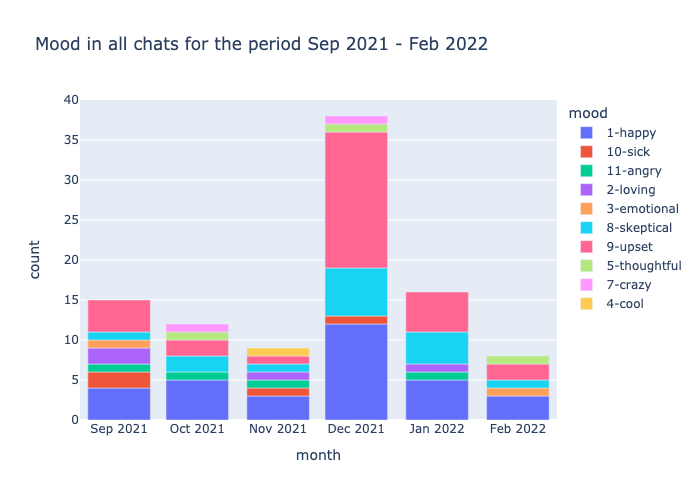

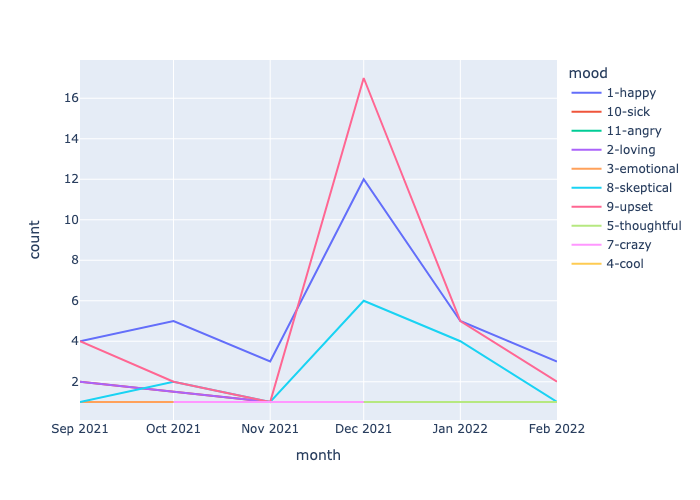

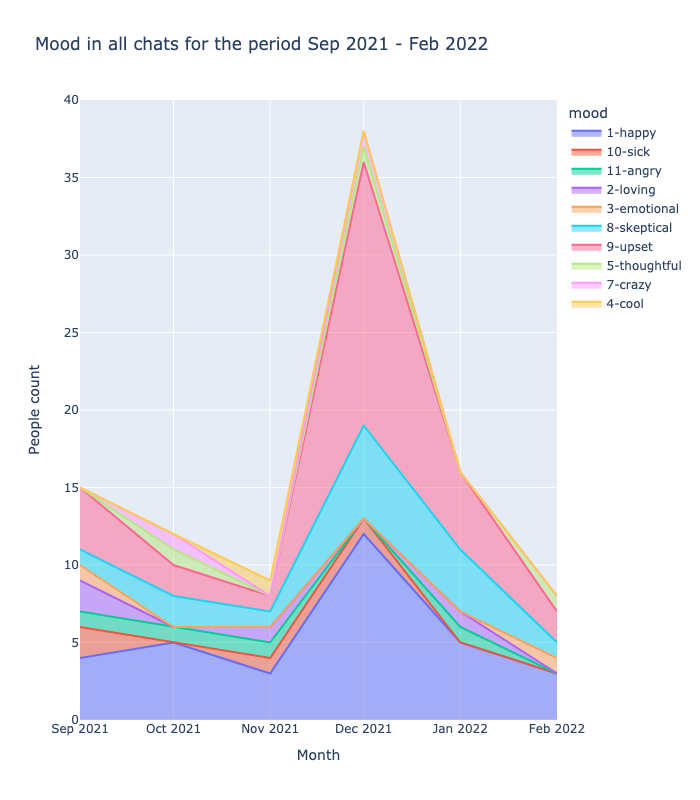

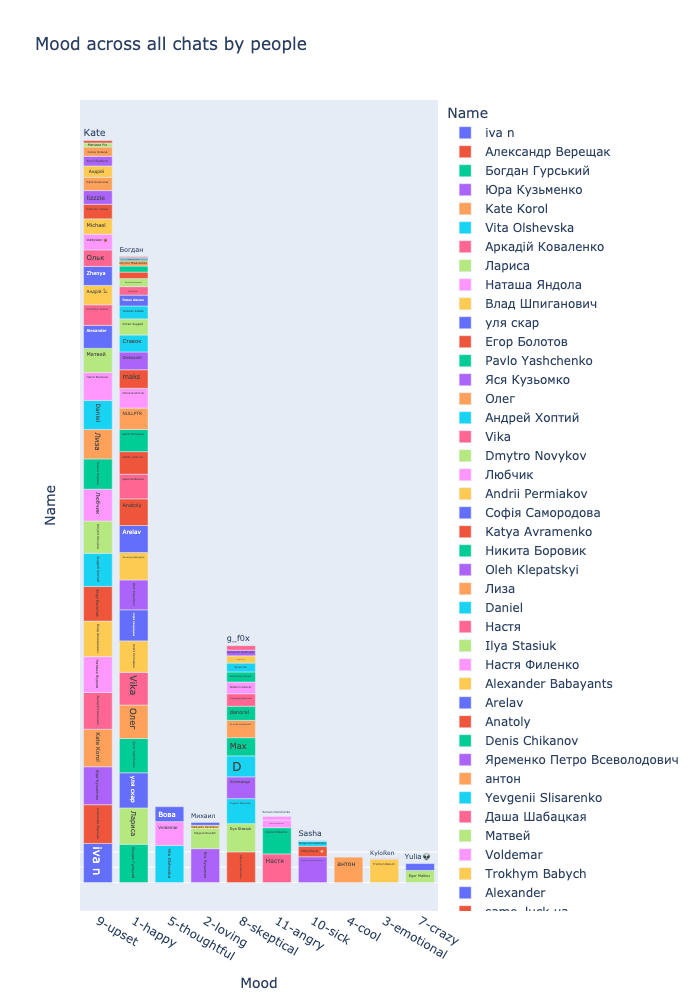

In [35]:
df_temp = df_meta[df_meta['name'] == 'Примати20х2']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
primates = df
primates = primates[primates['type'] == 'sticker']
primates = primates[primates['from_id'].str.contains('NaN') == False]
primates = primates[primates['message'].str.contains('NaN') == False]


primates['from_id'] = primates['from_id'].str.extract('(\d+)');

primates['mood']= primates.groupby('from_id')['message'].transform(lambda x: find_mood(x))

primates = primates.drop_duplicates(subset='from_id', keep='first')

primates['name'] = primates['from_id'].apply(lambda x: find_row_by_id(x))
primates = primates[primates['name'].str.contains('NaN') == False]

primates["datetime"] = pd.to_datetime(primates['date'])
primates = primates.loc[(primates['datetime'] >= '2021-09-01') & (primates['datetime'] < '2022-12-31')]
primates['month'] = primates['datetime']
primates['month'] = primates['month'].dt.strftime('%Y-%m')
date_df_hello = primates.groupby(['month', 'mood'])['mood'].count().reset_index(name='count')

fig = px.bar(date_df_hello, x="month", y="count", color="mood", title="Mood in all chats for the period Sep 2021 - Feb 2022")
fig.show(renderer='png')

fig = px.line(date_df_hello, x="month", y="count", color='mood')
fig.show(renderer='png')

fig = px.area(date_df_hello, x="month", y="count", color="mood", line_group="mood", 
              labels={'month':'Month', 'count': 'People count'}, title = 'Mood in all chats for the period Sep 2021 - Feb 2022', height=800)
fig.show(renderer='png')

fig = px.bar(primates, x='mood', y='name',
             hover_data=['mood', 'name'], color='name',  text_auto=True,
             labels={'mood':'Mood', 'name': 'Name'}, title= 'Mood across all chats by people', height=1000)
fig.update_yaxes(showticklabels=False)
fig.show(renderer='png')

28. Mood across all chats and in period of half year (sorted by mood)

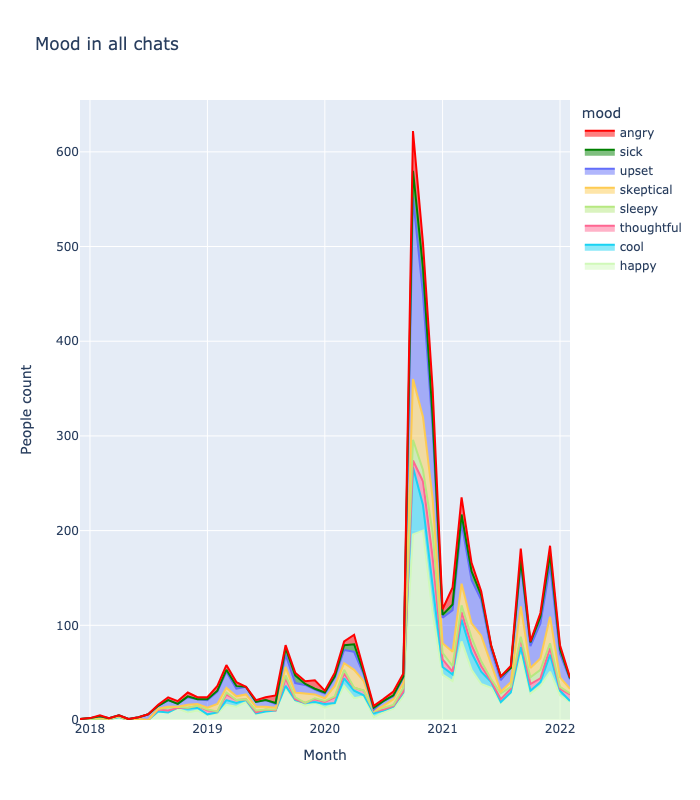

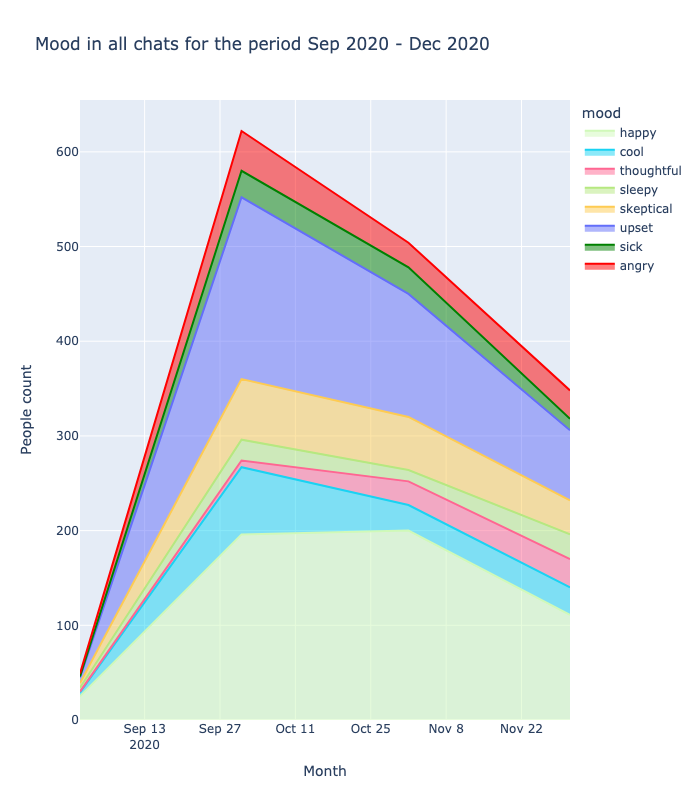

In [149]:
def find_mood_of_sticker(emoji):
    if (emoji in mood_emojis['happy']):
        return ('1-happy')
    if (emoji in mood_emojis['angry']):
        return '11-angry'
    if (emoji in mood_emojis['love']):
        return '1-happy'
    if (emoji in mood_emojis['crazy']):
        return '1-happy'
    if (emoji in mood_emojis['thoughtful']):
        return '5-thoughtful'
    if (emoji in mood_emojis['skeptical']):
        return '8-skeptical'
    if (emoji in mood_emojis['cool']):
        return '4-cool'
    if (emoji in mood_emojis['emotional']):
        return '1-happy'
    if (emoji in mood_emojis['sleepy']):
        return '6-sleepy'
    if (emoji in mood_emojis['sick']):
        return '10-sick'
    if (emoji in mood_emojis['upset']):
        return '9-upset'

primates = df
primates = primates[primates['type'] == 'sticker']
primates = primates[primates['from_id'].str.contains('NaN') == False]
primates = primates[primates['message'].str.contains('NaN') == False]


primates['from_id'] = primates['from_id'].str.extract('(\d+)');

primates['mood'] = primates['message'].apply(lambda x: find_mood_of_sticker(x))



primates["datetime"] = pd.to_datetime(primates['date'])

primates['month'] = primates['datetime']
primates['month'] = primates['month'].dt.strftime('%Y-%m')

date_df_hello_all_period = primates.groupby(['month', 'mood'])['mood'].count().reset_index(name='count')
date_df_hello_all_period[['priority','mood']] = date_df_hello_all_period['mood'].str.split("-",expand=True)
date_df_hello_all_period['priority'] = date_df_hello_all_period['priority'].astype(int)
date_df_hello_all_period=date_df_hello_all_period.sort_values(by='priority', ascending=True)

fig = px.area(date_df_hello_all_period, x="month", y="count", color="mood", 
             color_discrete_map = {'happy': '#d0f9b9', 'angry': 'red', 'sick': 'green', 'upset': '#636efa',
                                    'skeptical': '#fecb52'},
              line_group="mood", 
              labels={'month':'Month', 'count': 'People count'}, title = 'Mood in all chats', height=800)
fig.update_layout(legend_traceorder="reversed")
fig.show(renderer='png')

primates = primates.loc[(primates['datetime'] >= '2020-09-01') & (primates['datetime'] < '2020-12-31')]
primates['month'] = primates['datetime']
primates['month'] = primates['month'].dt.strftime('%Y-%m')

date_df_hello = primates.groupby(['month', 'mood'])['mood'].count().reset_index(name='count')
date_df_hello[['priority','mood']] = date_df_hello['mood'].str.split("-",expand=True)
date_df_hello['priority'] = date_df_hello['priority'].astype(int)
date_df_hello=date_df_hello.sort_values(by='priority', ascending=True)

fig = px.area(date_df_hello, x="month", y="count", color="mood", line_group="mood", 
              labels={'month':'Month', 'count': 'People count'}, 
              color_discrete_map = {'happy': '#d0f9b9', 'angry': 'red', 'sick': 'green', 'upset': '#636efa',
                                    'skeptical': '#fecb52'},
              title = 'Mood in all chats for the period Sep 2020 - Dec 2020', height=800)
fig.update_layout(legend_traceorder="normal")
fig.show(renderer='png')


29. Mood of people in "Примати20х2" during session in winter 2021

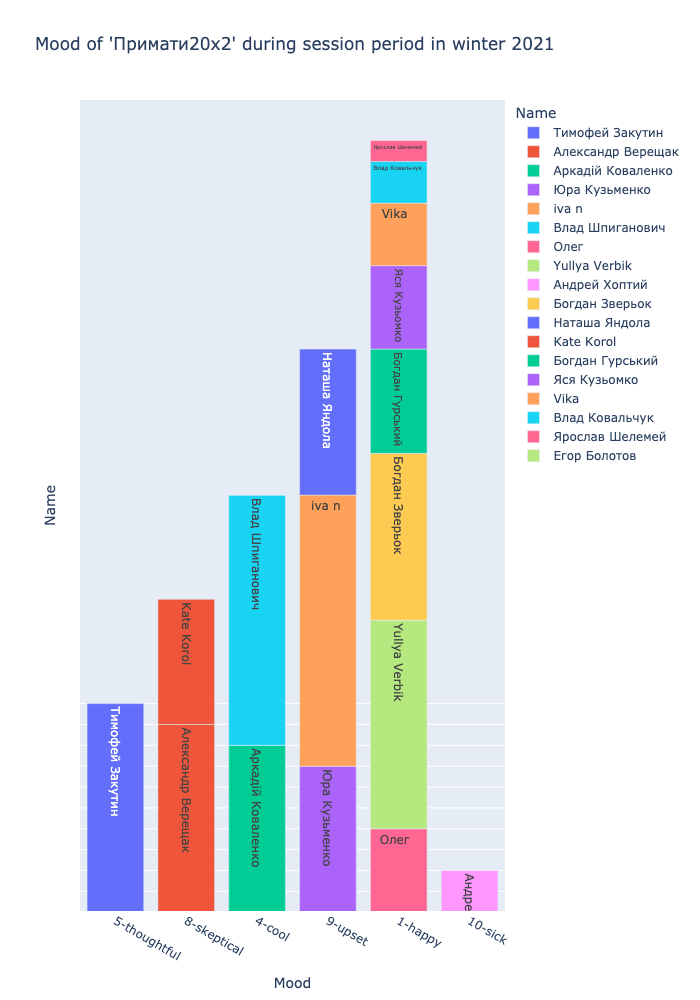

In [137]:


df_temp = df_meta[df_meta['name'] == 'Примати20х2']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
primates = df[df['dialog_id'] == group_id]
primates = primates[primates['type'] == 'sticker']
primates = primates[primates['from_id'].str.contains('NaN') == False]
primates = primates[primates['message'].str.contains('NaN') == False]
primates["datetime"] = pd.to_datetime(primates['date'], format='%Y-%m-%d')

primates = primates.loc[(primates['datetime'] >= '2021-11-01') & (primates['datetime'] < '2021-12-31')]


primates['from_id'] = primates['from_id'].str.extract('(\d+)');

primates['mood']= primates.groupby('from_id')['message'].transform(lambda x: find_mood(x))

primates = primates.drop_duplicates(subset='from_id', keep='first')

primates['name'] = primates['from_id'].apply(lambda x: find_row_by_id(x))
primates = primates[primates['name'].str.contains('NaN') == False]



fig = px.bar(primates, x='mood', y='name',
             hover_data=['mood', 'name'], color='name',  text_auto=True,
             labels={'mood':'Mood', 'name': 'Name'}, 
             title= 'Mood of \'Примати20х2\' during session period in winter 2021', height=1000)
fig.update_yaxes(showticklabels=False)
fig.show(renderer='png')

30. Mood of people in "Примати20х2" during session in winter 2020

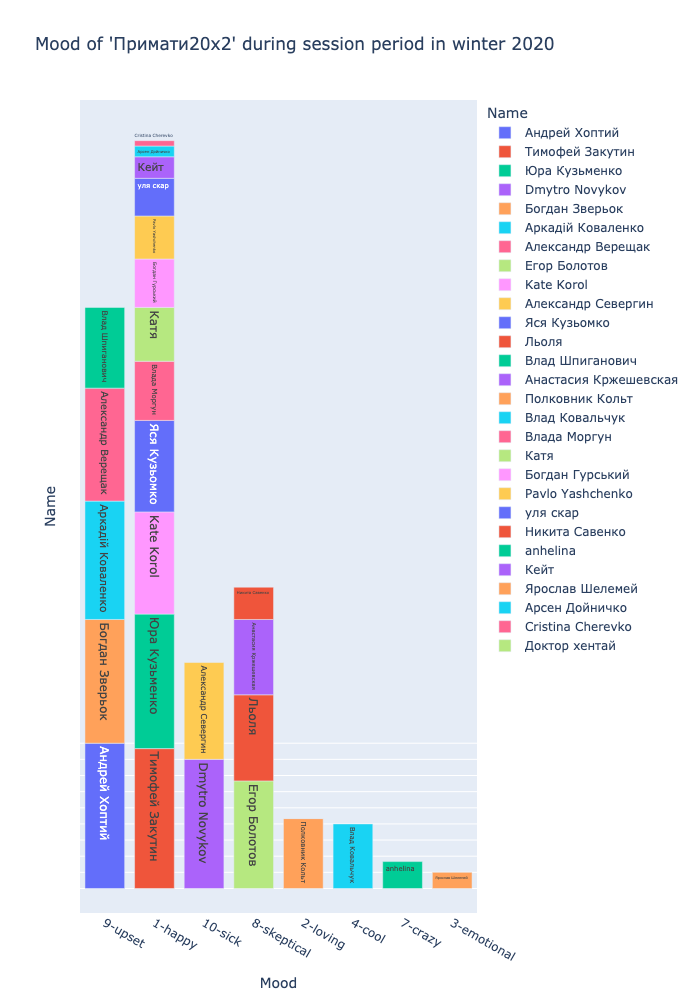

In [38]:

df_temp = df_meta[df_meta['name'] == 'Примати20х2']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
primates = df[df['dialog_id'] == group_id]
primates = primates[primates['type'] == 'sticker']
primates = primates[primates['from_id'].str.contains('NaN') == False]
primates = primates[primates['message'].str.contains('NaN') == False]
primates["datetime"] = pd.to_datetime(primates['date'], format='%Y-%m-%d')

primates = primates.loc[(primates['datetime'] >= '2020-11-01') & (primates['datetime'] < '2020-12-31')]


primates['from_id'] = primates['from_id'].str.extract('(\d+)');

primates['mood']= primates.groupby('from_id')['message'].transform(lambda x: find_mood(x))

primates = primates.drop_duplicates(subset='from_id', keep='first')

primates['name'] = primates['from_id'].apply(lambda x: find_row_by_id(x))
primates = primates[primates['name'].str.contains('NaN') == False]



fig = px.bar(primates, x='mood', y='name',
             hover_data=['mood', 'name'], color='name',  text_auto=True,
             labels={'mood':'Mood', 'name': 'Name'}, title= 'Mood of \'Примати20х2\' during session period in winter 2020', height=1000)
fig.update_yaxes(showticklabels=False)
fig.show(renderer='png')

31. Mood of people in "Примати20х2" during session in spring 2021

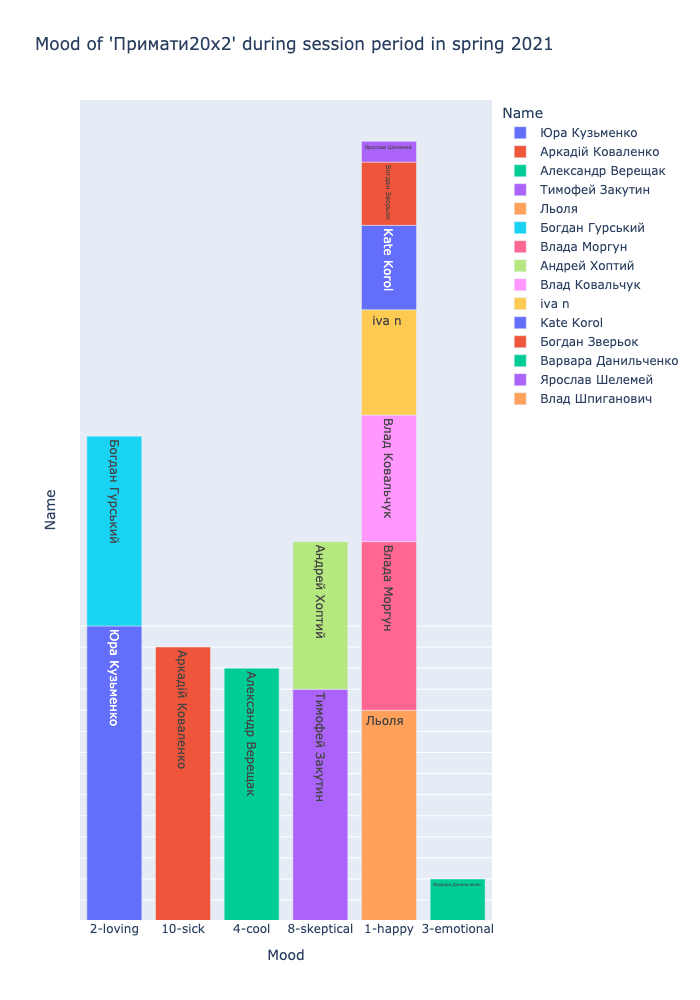

In [39]:

df_temp = df_meta[df_meta['name'] == 'Примати20х2']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
primates = df[df['dialog_id'] == group_id]
primates = primates[primates['type'] == 'sticker']
primates = primates[primates['from_id'].str.contains('NaN') == False]
primates = primates[primates['message'].str.contains('NaN') == False]
primates["datetime"] = pd.to_datetime(primates['date'], format='%Y-%m-%d')

primates = primates.loc[(primates['datetime'] >= '2021-04-11') & (primates['datetime'] < '2021-05-07')]


primates['from_id'] = primates['from_id'].str.extract('(\d+)');

primates['mood']= primates.groupby('from_id')['message'].transform(lambda x: find_mood(x))

primates = primates.drop_duplicates(subset='from_id', keep='first')

primates['name'] = primates['from_id'].apply(lambda x: find_row_by_id(x))
primates = primates[primates['name'].str.contains('NaN') == False]



fig = px.bar(primates, x='mood', y='name',
             hover_data=['mood', 'name'], color='name',  text_auto=True,
             labels={'mood':'Mood', 'name': 'Name'}, title= 'Mood of \'Примати20х2\' during session period in spring 2021', height=1000)
fig.update_yaxes(showticklabels=False)
fig.show(renderer='png')

32. Links in messages

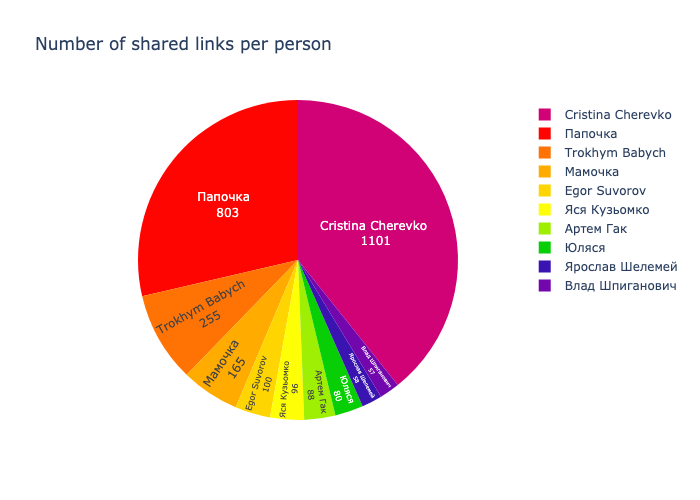

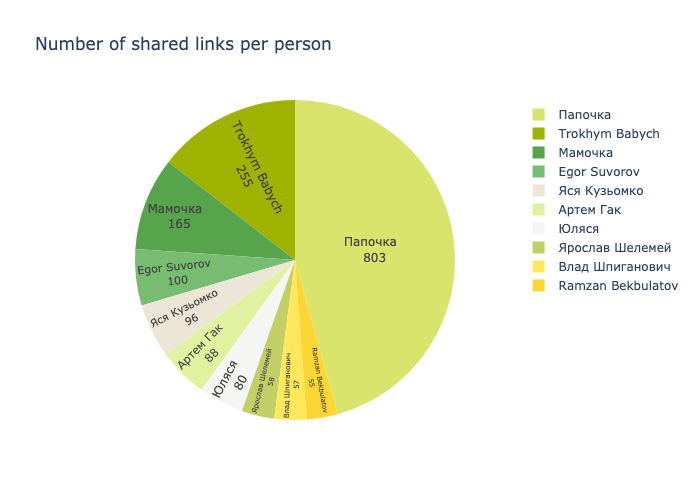

In [40]:
def find_link(x):
    link_count = 0
    for message in x.tolist():
        link_array = (re.findall(r'(https?://[^\s]+)', message))
        link_count += len(link_array)
    #print("count: ", link_count)
    return link_count
    

links_df = df[df['message'].str.contains('NaN') == False].reset_index(drop=True)
links_df = links_df[links_df['from_id'].str.contains('NaN') == False]
links_df['from_id'] = links_df['from_id'].str.extract('(\d+)');
links_df['link_count'] = links_df.groupby('from_id')['message'].transform(lambda x: find_link(x))

links_df = links_df.drop_duplicates(subset='from_id', keep='first')
links_df['name'] = links_df['from_id'].apply(lambda x: find_row_by_id(x))
links_df = links_df[links_df['name'].str.contains('NaN') == False]
top10_with_me = links_df.nlargest(10, ['link_count'])

colors = ['#d10276', '#fe0501', '#ff7304', '#ffab00', '#fed500', '#fefe06', '#9fef04', '#08ce05', '#3914b1', '#7307ae']
fig = px.pie(top10_with_me, values='link_count', names='name', title = 'Number of shared links per person')
fig.update_traces(textposition='inside', textinfo='value+label', marker=dict(colors=colors))
fig.show(renderer='png')

colors2 = ['#D8E46B', '#9DB300', '#57A44D', '#78BC71', '#EDE6D6', '#E2F1A0', '#F5F5F4', 'C2CF67', '#FFE85C', '#FCD733']
top10 = links_df[links_df['from_id'].str.contains(my_id) == False]
top10 = top10.nlargest(10, ['link_count'])
fig = px.pie(top10, values='link_count', names='name', title = 'Number of shared links per person')
fig.update_traces(textposition='inside', textinfo='value+label', marker=dict(colors=colors2))
fig.show(renderer='png')

33. Top-10 domains in my telegram

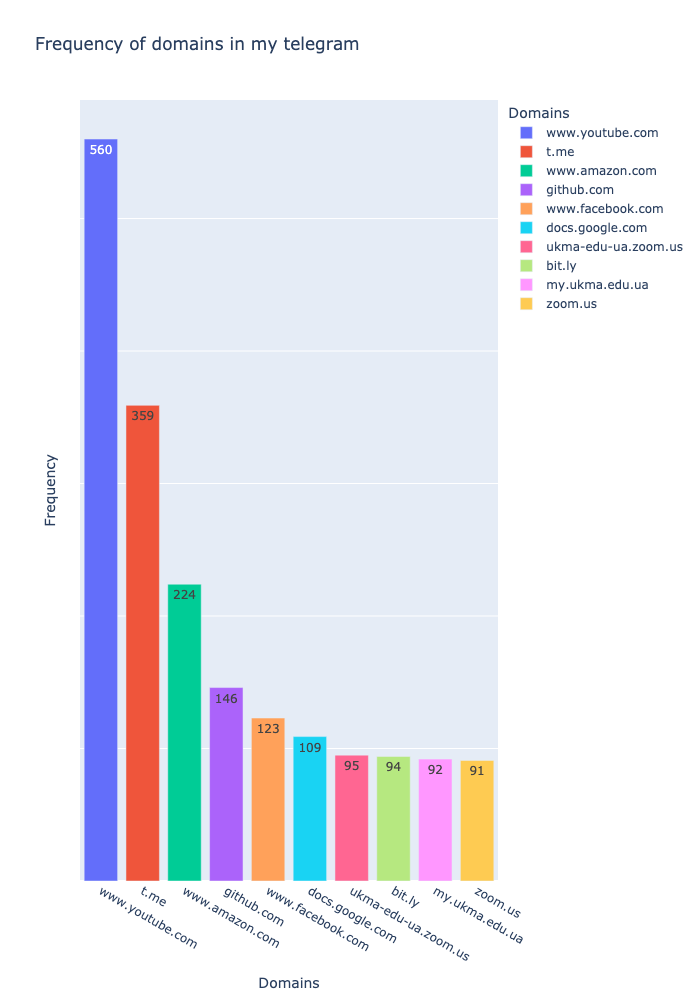

In [98]:
from urllib.parse import urlparse

def extract_link(message):
    res = []
    link_array = (re.findall(r'(https?://[^\s]+)', message))
    if (len(link_array) > 0):
        for link_in_array in link_array:
            res.append(link_in_array)
    if (len(res) > 0):
        return res
    else:
        return float('NaN')

def find_domains(links):
    res = []
    for link_in_array in links:
        domain = urlparse(link_in_array).netloc
        if (domain == 'youtu.be'):
            domain = 'www.youtube.com'
        res.append(domain)
    return res
    
domains_df = df[df['message'].str.contains('NaN') == False]
domains_df = domains_df[domains_df['from_id'].str.contains('NaN') == False]
domains_df['from_id'] = domains_df['from_id'].str.extract('(\d+)');
domains_df['links'] = domains_df['message'].apply(lambda x: extract_link(x))
domains_df = domains_df[domains_df['links'].notna()]
domains_df['domains'] = domains_df['links'].apply(lambda x: find_domains(x))
s = domains_df.apply(lambda x: pd.Series(x['domains']), axis=1).stack().reset_index(level=1, drop=True)
s.name = 'domains'
domains_df = domains_df.drop('domains', axis=1).join(s)
domains_df['domains'] = pd.Series(domains_df['domains'], dtype=object)
domains_df = domains_df.groupby('domains')['domains'].count().reset_index(name='count')
top10 = domains_df.nlargest(10, ['count'])


fig = px.bar(top10, x='domains', y='count',
             hover_data=['domains', 'count'], color='domains',  text_auto=True,
             labels={'count':'Frequency', 'domains': 'Domains'}, 
             title= 'Frequency of domains in my telegram', height=1000)
fig.update_yaxes(showticklabels=False)
fig.show(renderer='png')

34. Usage of languages in my telegram

In [41]:
alphabets = {'english': ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q',
                      'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z'],
          'ukrainian': ['а', 'б', 'в', 'г', 'ґ', 'д', 'е', 'є', 'ж', 'з', 'и', 'і', 'ї', 'й', 'к', 'л', 'м', 'н', 
                        'о', 'п', 'р', 'с', 'т', 'у', 'ф', 'х', 'ц', 'ч', 'ш', 'щ', 'ь', 'ю', 'я'],
          'russian': ['а', 'б', 'в', 'г', 'д', 'е', 'ё', 'ж', 'з', 'и', 'й', 'к', 'л', 'м', 'н', 'о', 'п', 'р', 
                      'с', 'т', 'у', 'ф', 'х', 'ц', 'ч', 'ш', 'щ', 'ъ', 'ы', 'ь', 'э', 'ю', 'я']}



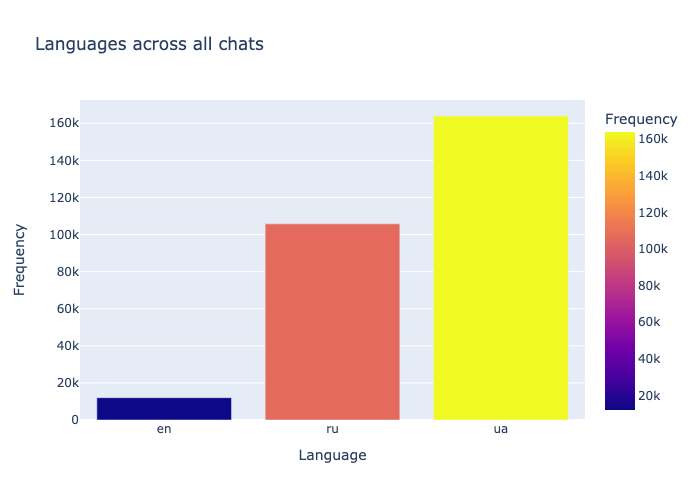

In [99]:
def detect_language_of_message(x):
    count_ua = 0
    count_en = 0
    count_ru = 0
    words = x.replace('!', ' ').replace('?', ' ').replace(',', ' ').replace(';', ' ').replace('.', ' ').replace(':)', ' ').replace(':', ' ').replace('(', ' ').replace('+', ' ').replace(')', ' ').split()
    string = x.replace('!', ' ').replace('?', ' ').replace(',', ' ').replace(';', ' ').replace('.', ' ').replace(':)', ' ').replace(':', ' ').replace('(', ' ').replace('+', ' ').replace(')', ' ') 
    for letter in list(string.lower()):
        if (letter in alphabets['ukrainian']):
            count_ua += 1
        if (letter in alphabets['english']):
            count_en += 1
        if (letter in alphabets['russian']):
            count_ru += 1
    max_value = max([count_ua, count_en, count_ru])
    if ((count_ua == max_value) & ~(max_value == count_ru) & ~(max_value == count_en)):
        return 'ua'
    if ((max_value == count_en) & ~(max_value == count_ua) & ~(max_value == count_ru)):
        return 'en'
    if ((max_value == count_ru) & ~(max_value == count_ua) & ~(max_value == count_en)):
        return 'ru'
    for word in words:
        if (word.lower() in ua_stopwords):
            return 'ua'
        if (word.lower() in ru_stopwords):
            return 'ru'
    return float('NaN')
        
lang_df = df[df['message'].str.contains('NaN') == False]
lang_df = lang_df[lang_df['from_id'].str.contains('NaN') == False]
lang_df['from_id'] = lang_df['from_id'].str.extract('(\d+)');
lang_df['lang'] = lang_df['message'].apply(lambda x: detect_language_of_message(x))
group = lang_df.groupby('lang')['lang'].count().reset_index(name='count')


fig = px.bar(group, x='lang', y='count', labels={"lang": "Language", "count": "Frequency"},
             hover_data=['lang', 'count'], color='count',
             title='Languages across all chats', height=500)
fig.show(renderer='png')

35. Usage of languages in "ФІ"

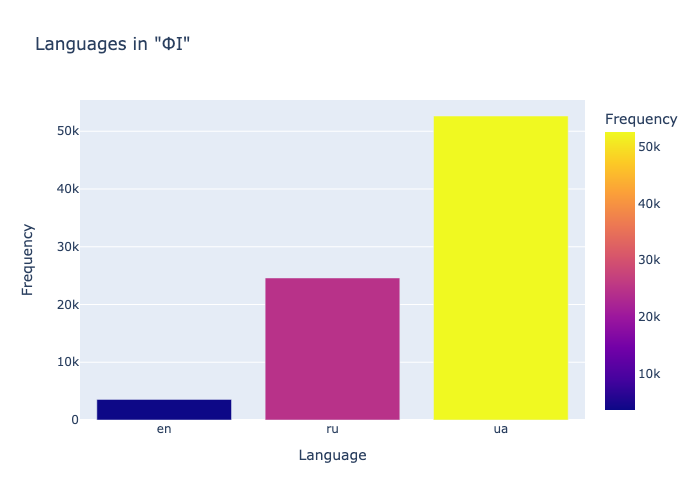

In [44]:
df_temp = df_meta[df_meta['name'] == 'ФІ']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
primates = df[df['dialog_id'] == group_id]

lang_df = primates[primates['message'].str.contains('NaN') == False]
lang_df = lang_df[lang_df['from_id'].str.contains('NaN') == False]
lang_df['from_id'] = lang_df['from_id'].str.extract('(\d+)');
lang_df['lang'] = lang_df['message'].apply(lambda x: detect_language_of_message(x))
group = lang_df.groupby('lang')['lang'].count().reset_index(name='count')

fig = px.bar(group, x='lang', y='count', labels={"lang": "Language", "count": "Frequency"},
             hover_data=['lang', 'count'], color='count',
             title='Languages in "ФІ"', height=500)

fig.update_layout(showlegend=False)
fig.show(renderer='png')

36. Usage of languages in "Примати20х2"

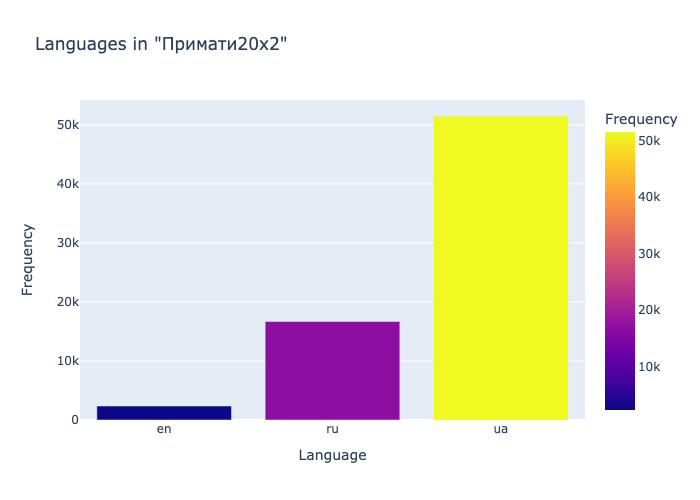

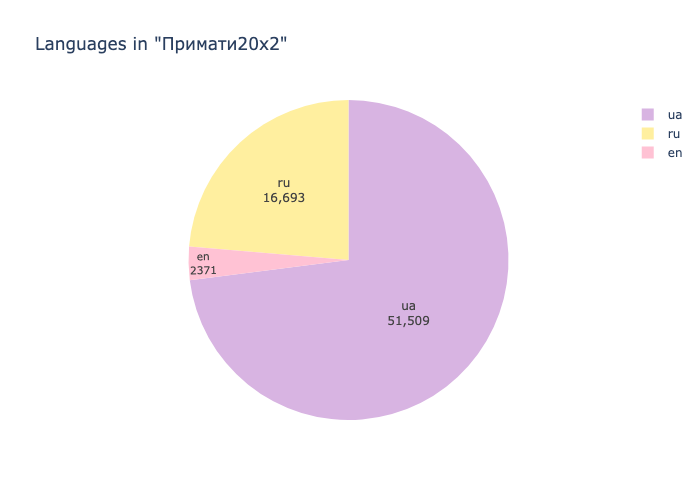

In [45]:
df_temp = df_meta[df_meta['name'] == 'Примати20х2']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
primates = df[df['dialog_id'] == group_id]

lang_df = primates[primates['message'].str.contains('NaN') == False]
lang_df = lang_df[lang_df['from_id'].str.contains('NaN') == False]
lang_df['from_id'] = lang_df['from_id'].str.extract('(\d+)');
lang_df['lang'] = lang_df['message'].apply(lambda x: detect_language_of_message(x))
group = lang_df.groupby('lang')['lang'].count().reset_index(name='count')

fig = px.bar(group, x='lang', y='count', labels={"lang": "Language", "count": "Frequency"},
             hover_data=['lang', 'count'], color='count',
             title='Languages in "Примати20х2"', height=500)
fig.show(renderer='png')
colors = ['#ffc2d4', '#ffef9f', '#D8B4E2']
fig = px.pie(group, values='count', names='lang', title = 'Languages in "Примати20х2"')
fig.update_traces(textposition='inside', textinfo='value+label', marker=dict(colors=colors))
fig.show(renderer='png')

37. My usage of languages

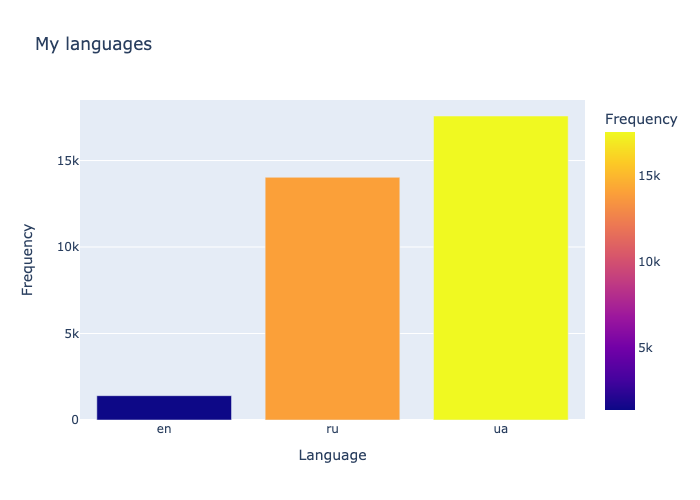

In [46]:
lang_df = df[df['from_id'].str.contains(my_id, na=False)]
lang_df = lang_df[lang_df['message'].str.contains('NaN') == False]
lang_df = lang_df[lang_df['from_id'].str.contains('NaN') == False]
lang_df['from_id'] = lang_df['from_id'].str.extract('(\d+)');
lang_df['lang'] = lang_df['message'].apply(lambda x: detect_language_of_message(x))
group = lang_df.groupby('lang')['lang'].count().reset_index(name='count')

fig = px.bar(group, x='lang', y='count', labels={"lang": "Language", "count": "Frequency"},
             hover_data=['lang', 'count'], color='count',
             title='My languages', height=500)
fig.show(renderer='png')

38. Types of chats

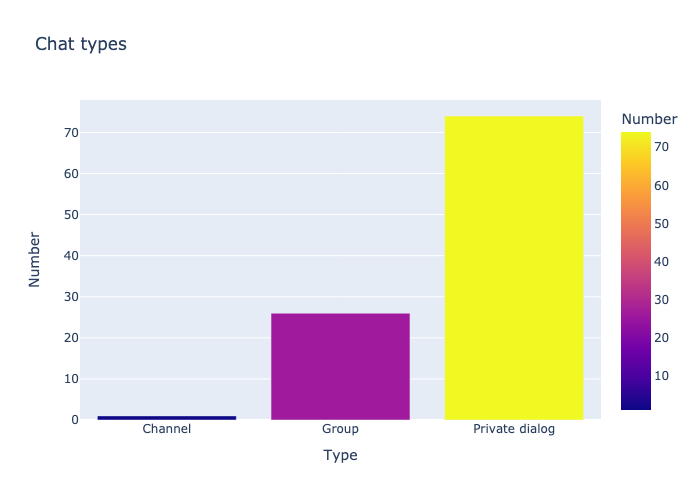

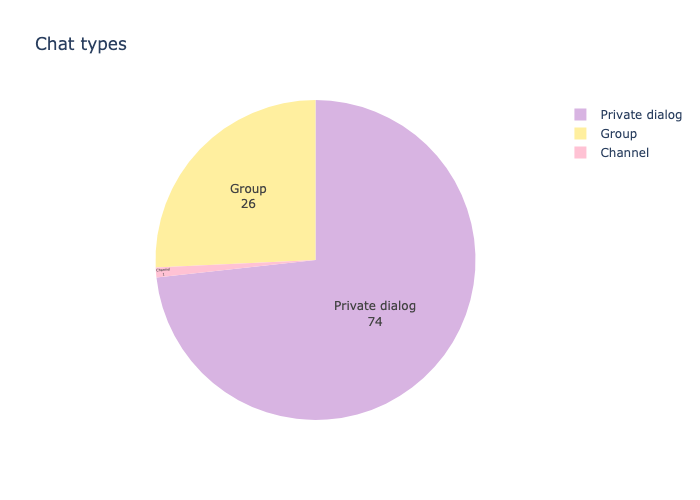

In [47]:
types_df = df_meta.drop_duplicates(subset='dialog_id', keep='first')
types = types_df.groupby('type')['type'].count().reset_index(name='count')

fig = px.bar(types, x='type', y='count', labels={"type": "Type", "count": "Number"},
             hover_data=['type', 'count'], color='count',
             title='Chat types', height=500)
fig.show(renderer='png')

colors = ['#ffc2d4', '#ffef9f', '#D8B4E2']
fig = px.pie(types, values='count', names='type', title = 'Chat types')
fig.update_traces(textposition='inside', textinfo='value+label', marker=dict(colors=colors))
fig.show(renderer='png')

39. Average length of message in my private chat with Liza. The conclusion from this analysis: I write more to Liza and my average is almost twice bigger than hers.

/var/folders/rp/vwfb10854bnbsyfl97kd408m0000gn/T/ipykernel_66282/1711405580.py:18: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



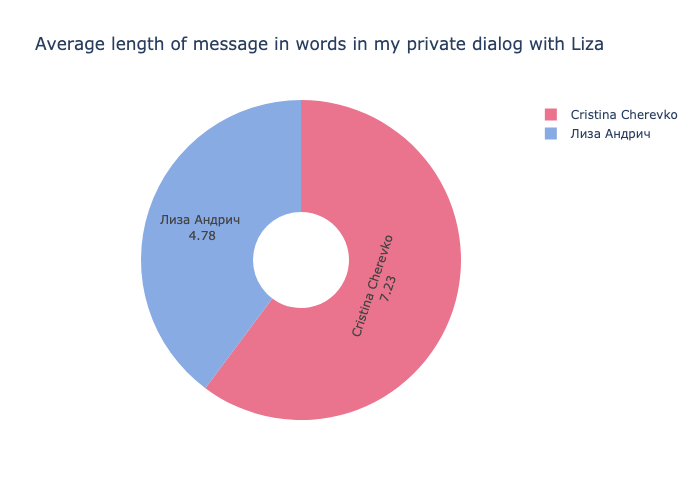

In [48]:
import math
def change_nan(x):
    if (x != x):
        return '336314102' 
    else:
        return x

df_temp = df_meta[df_meta['name'] == 'Лиза Андрич']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
private = df[df['dialog_id'] == group_id].reset_index(drop=True)

private['from_id'] = private['from_id'].str.extract('(\d+)');
private['from_id'] = private['from_id'].apply(lambda x: change_nan(x))
private = private[private['message'].str.contains('NaN') == False]
private['word_count'] = private['message'].apply(lambda x: get_words_count(x))
private['message_count'] = 1
private = private.groupby(['from_id'], as_index=False)["word_count", "message_count"].apply(lambda x : x.astype(int).sum())
#private = private.drop_duplicates(subset='from_id', keep='first')
private['avg_length'] = private.apply(lambda x: round(x['word_count'] / x['message_count'], 2), axis=1)
private['name'] = private['from_id'].apply(lambda x: find_row_by_id(x))


#print(private)



colors = ['#EA738DFF', '#89ABE3FF']
fig = px.pie(private, hole=.3, values='avg_length', names='name', title = 'Average length of message in words in my private dialog with Liza')
fig.update_traces(textposition='inside', textinfo='value+label', marker=dict(colors=colors))
fig.show(renderer='png')

40. Emojis breakdown in my private chat with Liza. The conclusion from this analysis is the same as above, but the difference is slightly bigger this time I sent almost 80% of emojis in our chat.

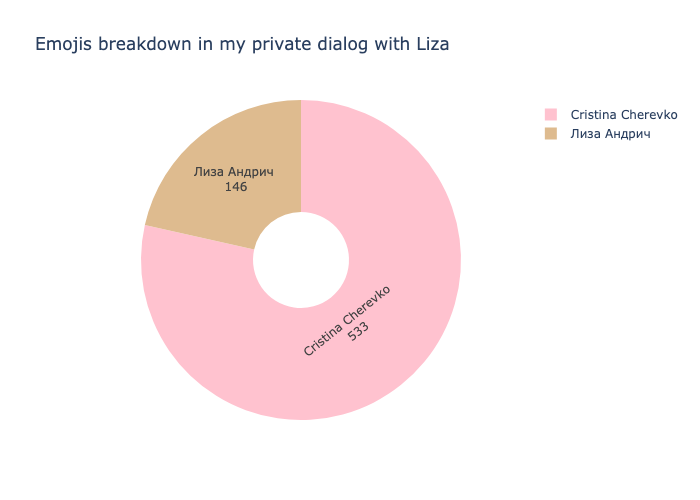

In [50]:
import emoji

def extract_emojis(s):
    #print(''.join(c for c in s if c in emoji.UNICODE_EMOJI['en']))
    for char in s:
        if (char in emoji.UNICODE_EMOJI['en']):
            return char
    return 'NaN'

df_temp = df_meta[df_meta['name'] == 'Лиза Андрич']
df_temp = df_temp.drop_duplicates(subset='dialog_id', keep='first')
group_id = df_temp['dialog_id'].values[0]
private = df[df['dialog_id'] == group_id].reset_index(drop=True)
private['from_id'] = private['from_id'].str.extract('(\d+)');
private['from_id'] = private['from_id'].apply(lambda x: change_nan(x))
private = private[private['message'].str.contains('NaN') == False]
private['message'] = private['message'].apply(lambda x: extract_emojis(x))
private = private[private['message'].str.contains('NaN') == False]
private['emoji_count'] = 1


private = private.groupby(['from_id'], as_index=False)['emoji_count'].apply(lambda x : x.astype(int).sum())
private['name'] = private['from_id'].apply(lambda x: find_row_by_id(x))

colors = ['#ffc2cf', '#debb8f']
fig = px.pie(private, hole=.3, values='emoji_count', names='name', title = 'Emojis breakdown in my private dialog with Liza')
fig.update_traces(textposition='inside', textinfo='value+label', marker=dict(colors=colors))
fig.show(renderer='png')
